In [1]:
import numpy as np
import pandas as pd
from scipy import interpolate

import xarray as xr
import dask.array as da
from dask.distributed import Client

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches # for creating legend
import matplotlib.dates as mdates # converts datetime64 to datetime

import cartopy
import cartopy.crs as ccrs # for plotting
import cartopy.feature as cfeature # for map features
from cartopy.util import add_cyclic_point # for wrapping map fully - avoiding white line on 0 deg
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

import matplotlib.dates as mdates # converts datetime64 to datetime
import matplotlib.gridspec as gridspec # to create grid-shaped combos of axes
from mpl_toolkits import mplot3d # 3d plotting tool
import cmocean # for nice oceanography colour pallettes

#import argopy
#from argopy import DataFetcher as ArgoDataFetcher # to load Argo ds directly

import os # for finding files

import gsw # for conversion functions

from tqdm.notebook import tqdm_notebook as tqdm
import glob # for downloading data
import sys # for path to functions

import seaborn as sns

sns.set(#font='Franklin Gothic Book',
        rc={
         'axes.axisbelow': False,
         'axes.edgecolor': 'Black',
         'axes.facecolor': 'w', 
                            # '#aeaeae',
         'axes.grid': False,
         'axes.labelcolor': 'k',
         'axes.spines.right': True,
         'axes.spines.top': True,
         'figure.facecolor': 'white',
         'lines.solid_capstyle': 'round',
         'patch.edgecolor': 'k',
         'patch.force_edgecolor': True,
         'text.color': 'k',
         'xtick.bottom': True,
         'xtick.color': 'k',
         'xtick.direction': 'out',
         'xtick.top': False,
         'ytick.color': 'k',
         'ytick.direction': 'out',
         'ytick.left': True,
         'ytick.right': False},
         font_scale=1)
mpl.rcParams["figure.titlesize"] = 25
mpl.rcParams["axes.titlesize"] = 22
mpl.rcParams["axes.labelsize"] = 20
mpl.rcParams["font.size"] = 18
mpl.rcParams["xtick.labelsize"] = 18
mpl.rcParams["ytick.labelsize"] = 18
mpl.rcParams["ytick.labelright"] = False

from warnings import filterwarnings as fw
fw('ignore')

# import my own funcs
import sys
sys.path.append('/home/theospira/notebooks/projects/01-WW_climatology/functions')
from plot_formatting import circular_boundary,plot_nice_box
from inspection_funcs import boxplot

import importlib
#importlib.reload(sys.modules['inspection_plot'])

In [2]:
sys.path.append('/home/theospira/notebooks/projects/03-WW-timeseries/funcs')
from plotting import *
from computations import *
from import_data import *

importlib.reload(sys.modules['plotting'])
from plotting import *

# sea ice plot: linear regression before and after Aug 2015

In [3]:
si = load_sea_ice()
si = si.sel(lat=slice(-80,-52)).sel(time=slice('2005-01-01','2022-01-01'))
# mask sea ice data
#si['ww_ct'] = tmp['ww_ct'].copy()
#si = mask_data(si)
si = calc_mean_var(si,'sia')
si = calc_mean_var(si,'sic')

# compute sia_anm
si['sia_anm'] = si.sia - si.sia_mn

# load bathym
bth = xr.open_mfdataset('/home/theospira/notebooks/data/GEBCO/gebco**.nc')
gs = 1 # gridcell size
bth = bth.sel(lat=slice(-80,-40)
        ).coarsen(lat=int(14400/60*gs),).mean(
        ).coarsen(lon=int(86400/360*gs),).mean().load()

cmap_br = get_cmap()

## plot

In [4]:
from plot_formatting import plot_gridlines

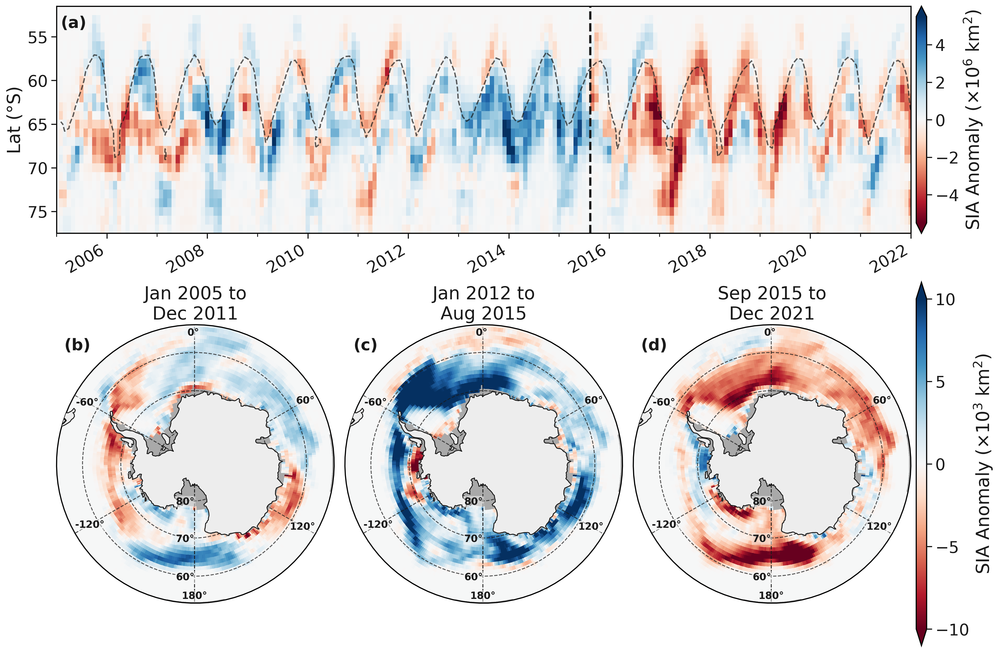

In [21]:
idx = int(np.where(si.time==np.datetime64('2015-08-31'))[0])

fig = plt.figure(figsize=(15*1.025, 10), constrained_layout=True, dpi=300)
gs  = gridspec.GridSpec(2, 4, figure=fig, height_ratios=[1.25, 2], width_ratios=[2/3, 2/3, 2/3, 0.025])
#gs2 = gridspec.GridSpec(5, 4, figure=fig, height_ratios=[3/4, 1.25, 0.5,1,0.5], 
#width_ratios=[2/3, 2/3, 2/3, 0.025])
crs = ccrs.PlateCarree()

# Create subplot axes and colorbar axes
ax = []
cax = []
for i in range(2):
    cax.append(fig.add_subplot(gs[i, -1]))

# plot time series of sea ice area
ax.append(fig.add_subplot(gs[0, :-1]))
cb_kw = dict(extend='both',shrink=0.8)
cnt_kw = dict(levels=[0.15],colors=['k'],linestyles=['--'],alpha=0.7,)
hmp = ((si.sia.sum('lon') - si.sia_mn.sum('lon'))*1e-6
          ).plot(x='time',ax=ax[-1],vmax=5.5,cmap=cmap_br.reversed(),add_colorbar=False,)
fig.colorbar(hmp,cax=cax[0],**cb_kw,label=r'SIA Anomaly ($\times 10^6$ km$^2$)')
si.sic.mean('lon').plot.contour(x='time',**cnt_kw)

# timeseries plot formatting
si_timeseries_plot_formatting(ax=ax[0],)
ax[0].set_ylim(-77.5,-51.5)
ax[0].set_ylabel('Lat (°S)')
ax[0].set_yticks(np.arange(-75,-50,5))
ax[0].set_yticks(ax[0].get_yticks(),labels=np.abs(ax[0].get_yticks()))

# create subplots for two time means before and after sea ice change
for i in range(3):
    ax.append(fig.add_subplot(gs[1, i], projection=ccrs.SouthPolarStereo()))
# format circular plots
for a in ax[1:]:
    circular_boundary(a)
    a.set_extent([0,360,-90,-53],crs=crs)
    a.add_feature(cfeature.LAND,zorder=9,facecolor="#ededed",)
    a.coastlines(zorder=10,color="k",) # shows continental coastline
    a.set_facecolor('darkgrey')

# plot average anomaly before and after Aug 2015
kwargs = dict(x='lon',add_colorbar=False,vmin=-10,cmap=cmap_br.reversed(),transform=crs)
(si.sia_anm*1e-3).sel(time=slice(np.datetime64('2005-01-01'),np.datetime64('2011-12-31'))
              ).mean('time').plot(ax=ax[1],**kwargs)
(si.sia_anm*1e-3).sel(time=slice(np.datetime64('2012-01-01'),np.datetime64('2015-08-31'))
                         ).mean('time').plot(ax=ax[2],**kwargs)
hmp = (si.sia_anm*1e-3).sel(time=slice(np.datetime64('2015-09-01'),np.datetime64('2022-01-01'))
                    ).mean('time').plot(ax=ax[3],**kwargs)

bbox_kw = dict(facecolor='#f7f7f7', edgecolor='None', boxstyle='round,pad=0.1',alpha=0.5,)
ann_kw  = dict(transform=crs,zorder=100,fontsize=11,weight='bold',bbox=bbox_kw)
for a,s in zip(ax[1:],['Jan 2005 to\nDec 2011','Jan 2012 to\nAug 2015','Sep 2015 to\nDec 2021']):
    a.set_title(s,fontsize=20)
    plot_gridlines(a,color='k',)
    #plot_gridlines(a,color='k',draw_labels=True,lat_tick=np.array([-80,-70, -60, -50]),)
    #plot_gridlines(a,color='k',draw_labels=False,lat_tick=np.array([-80]),)
    for lat in [-80,-70,-60]:
        a.annotate(str(lat)[1:]+'°',xy=(-180,lat+0.25),ha='right',va='center',**ann_kw)
    # add longitude labels
    for lon,lat in zip([-0.5,-60,-120,180,120,60],[-55,-57,-57.75,-55,-56.75,-56]):
        a.annotate(str(int(lon))+'°',xy=(lon,lat),ha='center',va='center',**ann_kw)

#for lon,lat in zip([-0.5,-60,-120,180],[-55,-53,-52.5,-51.5]):
    #ax[1].annotate(str(np.ceil(lon).astype(int))+'°',xy=(lon,lat),transform=crs,zorder=100,fontsize=12,
     #          weight='bold',ha='right',va='center',)
#for lon,lat in zip([0.5,60,120,180],[-55,-52.5,-52.5,-51.5]):
 #   ax[3].annotate(str(np.floor(lon).astype(int))+'°',xy=(lon,lat),transform=crs,zorder=100,fontsize=12,
  #             weight='bold',ha='left',va='center',)

fig.colorbar(hmp,cax=cax[1],extend='both',label='SIA Anomaly 'r'($\times 10^3$ km$^2$)',
            ticks=np.arange(-10,11,5))

ax[-1].set_ylabel('')
ax[-1].set_yticklabels('')

fig_labels(0.02,0.925,ax=ax[0],j=0,fs=18)
fig_labels(0.075,0.925,ax=ax[1:],j=1,add_bbox=False,fs=18)

#fig.tight_layout()

# extras

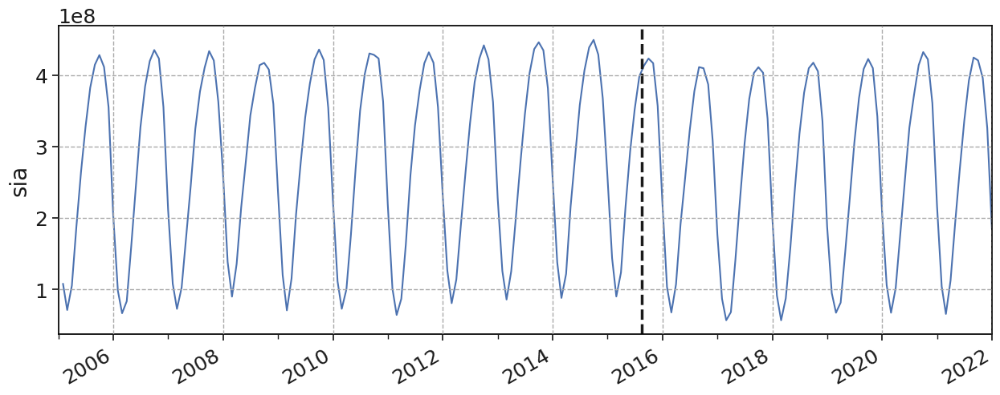

In [11]:
si.sia.sum(('lat','lon')).plot(x='time',figsize=(15,5))
plt.grid(ls='--',c='darkgrey')
si_timeseries_plot_formatting(ax=plt.gca())

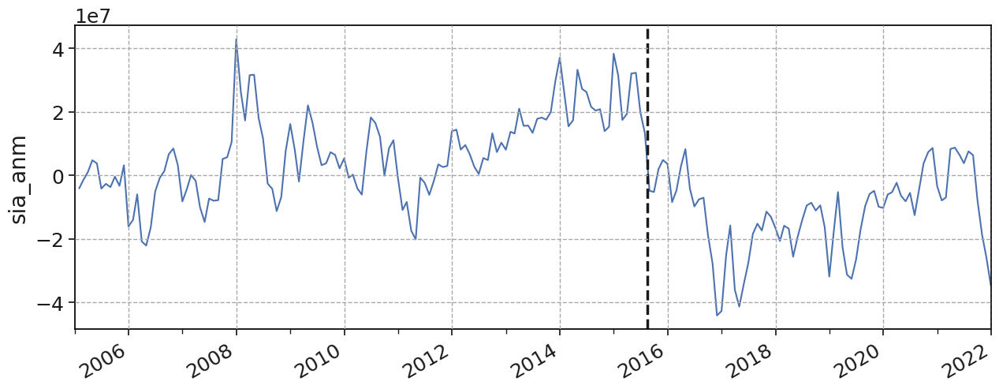

In [143]:
si.sia_anm.sum(('lat','lon')).plot(x='time',figsize=(15,5))
plt.grid(ls='--',c='darkgrey')
si_timeseries_plot_formatting(ax=plt.gca())

In [48]:
(si_mnths[i].max()*1e-6).round(-1)

<xarray.DataArray 'sia' ()>
array(260.)

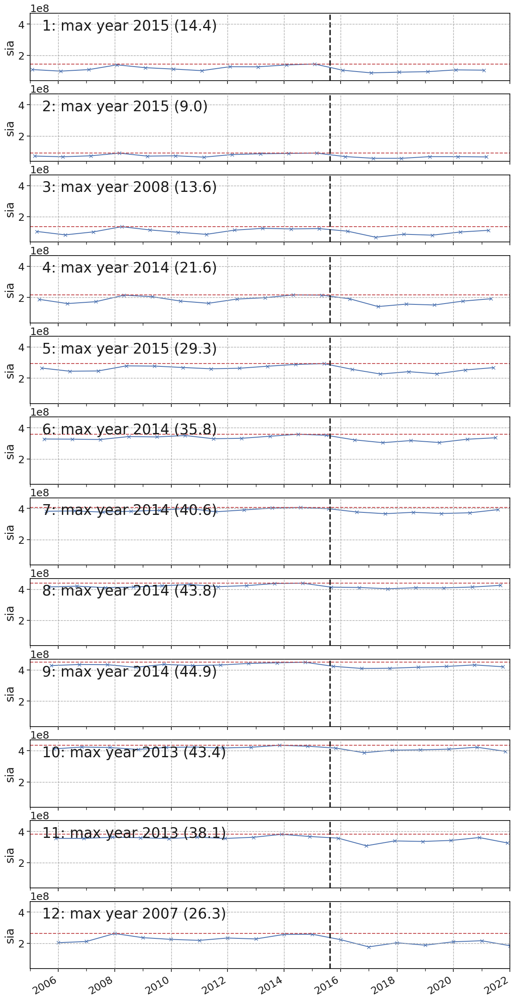

In [53]:
fig,ax = plt.subplots(12,1,figsize=(15,30),sharex=1,sharey=1)

si_mnths = si.sia.sum(('lat','lon')).groupby('time.month')
for a,i in zip(ax.flatten(),range(1,13)):
    a.annotate(f'{i}: max year {si_mnths[i].idxmax().dt.year.data} ({(si_mnths[i].max()*1e-7).round(1).data})',
               xy=(0.025,0.75),xycoords='axes fraction',fontsize=25)
    si_mnths[i].plot(x='time',ax=a,marker='x')
    a.axhline(si_mnths[i].max(),c='r',ls='--')
    si_timeseries_plot_formatting(ax=a)
    a.grid(ls='--',c='darkgrey')

In [67]:
np.unique(si_t.year).size

17

In [64]:
np.unique(monthly_rankings.sia_m)

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17.])

In [77]:
# Sum over 'lat' and 'lon' to get time series for sia and sia_anm
si_t = si[['sia', 'sia_anm']].sum(('lat', 'lon'))

# Extract years and months
si_t = si_t.assign_coords(year=si_t['time.year'], month=si_t['time.month'])

# Compute monthly rankings for sia and sia_anm
monthly_rankings = si_t.groupby('month').apply(lambda x: x.rank(dim='time'))

# Rename the variables to indicate ranking
monthly_rankings = monthly_rankings.rename({'sia': 'sia_m', 'sia_anm': 'sia_anm_m'})

# Combine original dataset with rankings
si_t = xr.merge([si_t.rank('time'), monthly_rankings])


In [80]:
# Sum over 'lat' and 'lon' to get time series for sia and sia_anm
si_t = si[['sia', 'sia_anm']].sum(('lat', 'lon'))

# Extract year and month
si_t = si_t.assign_coords(year=si_t['time.year'], month=si_t['time.month'])

# Reshape into a Dataset with dimensions year and month
si_t = si_t.set_index(time=['year', 'month']).unstack('time')

<xarray.DataArray 'sia' ()>
array(5.)
Coordinates:
    year     int64 2016
    month    int64 8

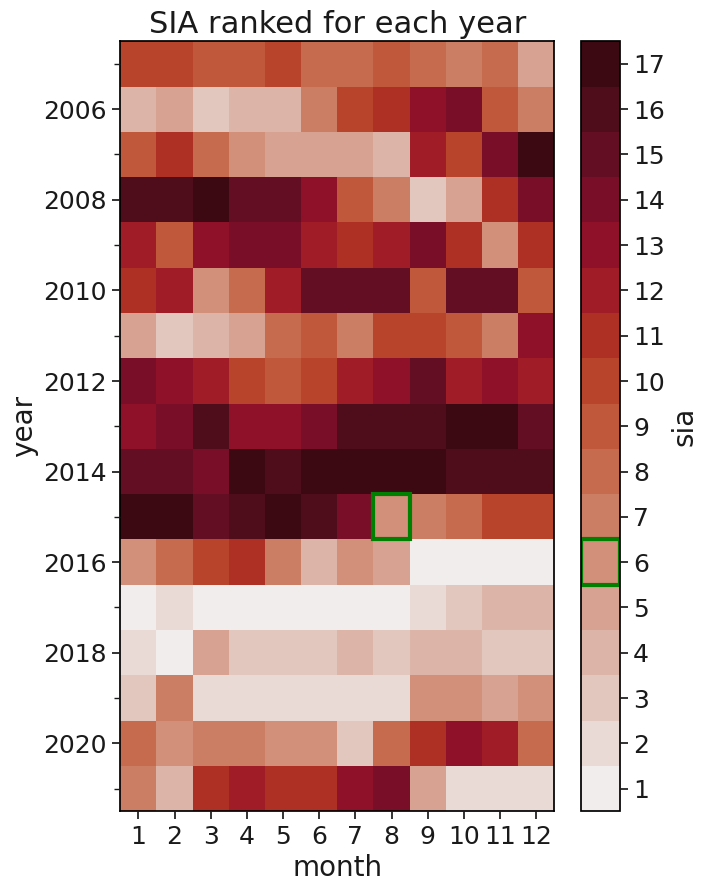

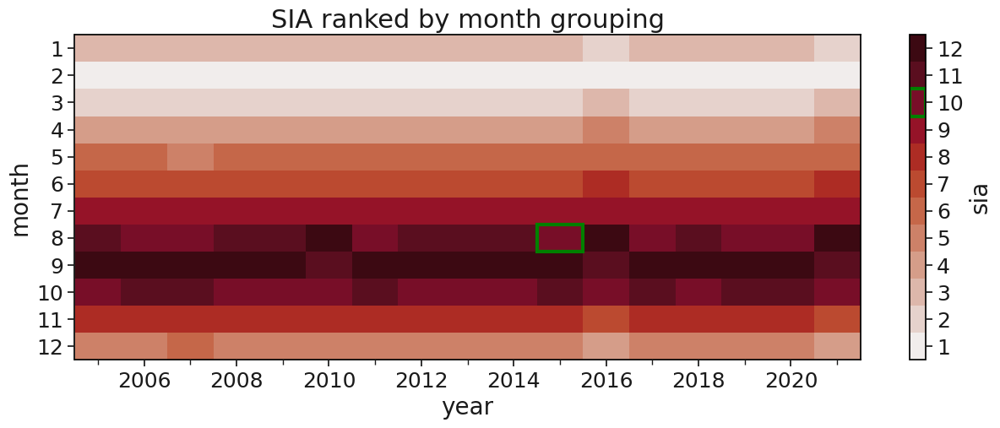

In [159]:
cb = si_t.rank('year').sia.plot(x='month',figsize=(7,10),levels=18,vmin=0.5,
                                vmax=17.5,cmap='cmo.amp').colorbar
cb.ax.set_yticks(np.arange(1,17.1,1))
cb.ax.minorticks_off()
plt.gca().set_yticks(np.arange(2005,2022,1),minor=1)
plt.gca().set_yticks(np.arange(2006,2022,2),)

plt.gca().set_xticks(np.arange(1,13,1),)

# Add a rectangle to box August 2016
highlight_year = 2015
highlight_month = 8

# Calculate the rectangle's position and size
rect_kw = dict(height=1,width=1,linewidth=3,edgecolor='green',facecolor='none')
year_index = list(years).index(highlight_year)
rect = patches.Rectangle(
    (highlight_month - 0.5, years[year_index] - 0.5),  # Bottom-left corner
    **rect_kw)
plt.gca().add_patch(rect)

# Add the rectangle to the colorbar
highlight_value = si_t.rank('year').sia.sel(year=highlight_year, month=highlight_month).item()
cb.ax.add_patch(
    patches.Rectangle(
        (0, highlight_value - 0.5), **rect_kw))

plt.gca().invert_yaxis()
plt.title("SIA ranked for each year")

cb = si_t.rank('month').sia.plot(x='year',figsize=(15,5),levels=13,vmin=0.5,
                                 vmax=12.5,cmap='cmo.amp').colorbar
cb.ax.set_yticks(np.arange(1,12.1,1))
cb.ax.minorticks_off()

plt.gca().set_xticks(np.arange(2005,2022,1),minor=1)
plt.gca().set_xticks(np.arange(2006,2022,2),)

plt.gca().set_yticks(np.arange(1,13,1),)

# Add a rectangle to box August 2016
highlight_year = 2015
highlight_month = 8

# Calculate the rectangle's position and size
year_index = list(years).index(highlight_year)
rect = patches.Rectangle(
    (years[year_index] - 0.5, highlight_month - 0.5,),**rect_kw)
plt.gca().add_patch(rect)

# Add the rectangle to the colorbar
highlight_value = si_t.rank('month').sia.sel(year=highlight_year, month=highlight_month).item()
cb.ax.add_patch(
    patches.Rectangle(
        (0, highlight_value - 0.5),  # Bottom-left corner
        **rect_kw))

plt.title("SIA ranked by month grouping")
plt.gca().invert_yaxis()


Text(0.5, 1.0, 'SIA anomaly ranked by month grouping')

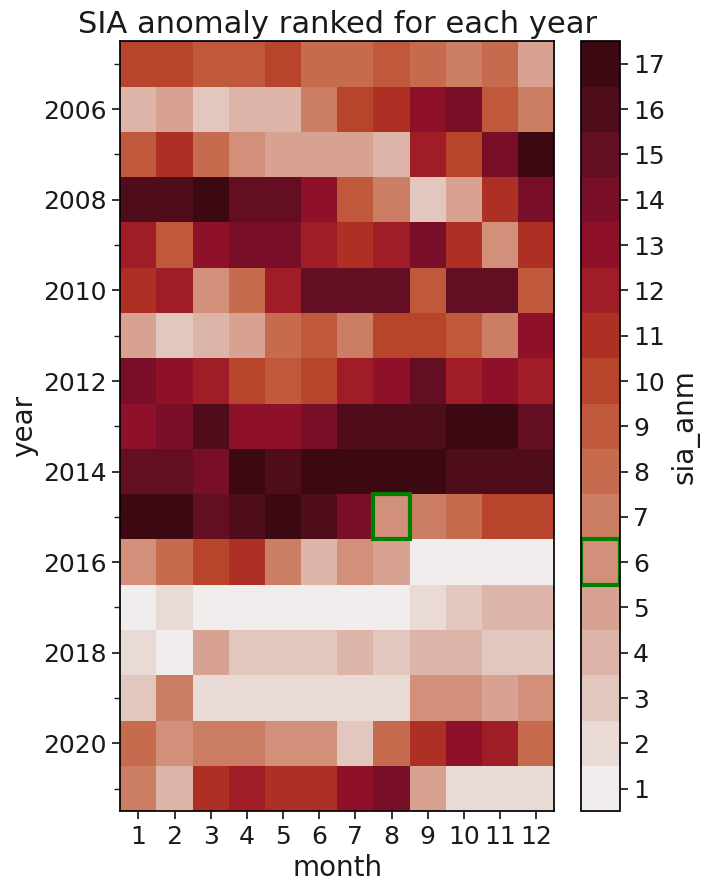

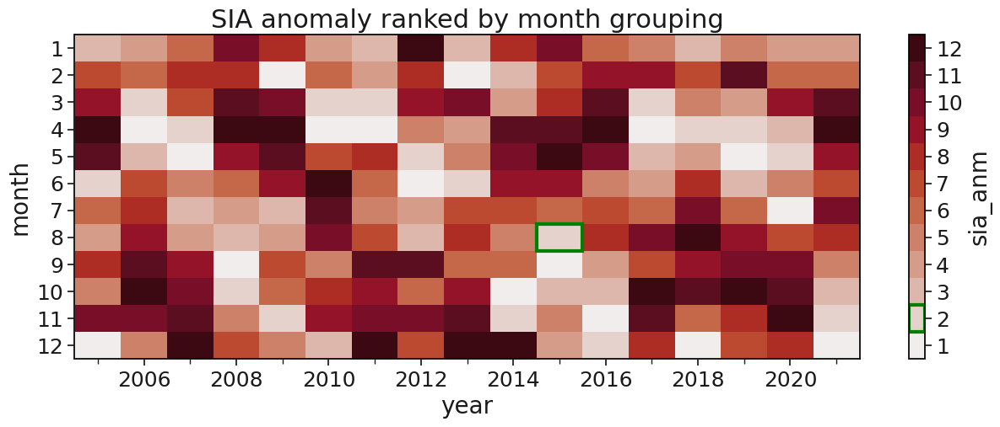

In [160]:
cb = si_t.rank('year').sia_anm.plot(x='month',figsize=(7,10),levels=18,vmin=0.5,
                                vmax=17.5,cmap='cmo.amp').colorbar
cb.ax.set_yticks(np.arange(1,17.1,1))
cb.ax.minorticks_off()
plt.gca().set_yticks(np.arange(2005,2022,1),minor=1)
plt.gca().set_yticks(np.arange(2006,2022,2),)

plt.gca().set_xticks(np.arange(1,13,1),)

# Add a rectangle to box August 2016
highlight_year = 2015
highlight_month = 8

# Calculate the rectangle's position and size
rect_kw = dict(height=1,width=1,linewidth=3,edgecolor='green',facecolor='none')
year_index = list(years).index(highlight_year)
rect = patches.Rectangle(
    (highlight_month - 0.5, years[year_index] - 0.5),  # Bottom-left corner
    **rect_kw)
plt.gca().add_patch(rect)

# Add the rectangle to the colorbar
highlight_value = si_t.rank('year').sia_anm.sel(year=highlight_year, month=highlight_month).item()
cb.ax.add_patch(
    patches.Rectangle(
        (0, highlight_value - 0.5), **rect_kw))

plt.gca().invert_yaxis()
plt.title("SIA anomaly ranked for each year")

### second plot
cb = si_t.rank('month').sia_anm.plot(x='year',figsize=(15,5),levels=13,vmin=0.5,
                                 vmax=12.5,cmap='cmo.amp').colorbar
cb.ax.set_yticks(np.arange(1,12.1,1))
cb.ax.minorticks_off()
plt.gca().set_xticks(np.arange(2005,2022,1),minor=1)
plt.gca().set_xticks(np.arange(2006,2022,2),)

plt.gca().set_yticks(np.arange(1,13,1),)

# Add a rectangle to box August 2016
highlight_year = 2015
highlight_month = 8

# Calculate the rectangle's position and size
year_index = list(years).index(highlight_year)
rect = patches.Rectangle(
    (years[year_index] - 0.5, highlight_month - 0.5,),**rect_kw)
plt.gca().add_patch(rect)

# Add the rectangle to the colorbar
highlight_value = si_t.rank('month').sia_anm.sel(year=highlight_year, month=highlight_month).item()
cb.ax.add_patch(
    patches.Rectangle(
        (0, highlight_value - 0.5),  # Bottom-left corner
        **rect_kw))
plt.gca().invert_yaxis()
plt.title("SIA anomaly ranked by month grouping")

In [185]:
print(si.time.size)
si['sia_anm'].sum(('lat','lon')).rank('time').sel(time=slice(np.datetime64('2004-01-01'),np.datetime64('2015-09-01')))

204


<xarray.DataArray 'sia_anm' (time: 128)>
array([ 87.,  98., 108., 125., 121.,  85.,  91.,  88., 103.,  90., 116.,
        33.,  39.,  71.,  18.,  17.,  31.,  77., 100., 109., 135., 148.,
       118.,  56.,  81., 105.,  96.,  47.,  37.,  63.,  58.,  61., 128.,
       131., 155., 204., 193., 175., 197., 198., 180., 158.,  92.,  83.,
        43.,  66., 142., 172., 143.,  95., 156., 190., 174., 152., 117.,
       122., 137., 133., 111., 129., 101., 106.,  86.,  69., 140., 182.,
       173., 159., 104., 149., 157.,  99.,  45.,  55.,  25.,  20., 102.,
        93.,  68.,  97., 119., 112., 115., 165., 167., 145., 153., 136.,
       113., 107., 130., 126., 162., 138., 154., 144., 164., 160., 188.,
       170., 171., 163., 179., 181., 178., 185., 195., 202., 191., 169.,
       176., 201., 194., 192., 189., 186., 187., 166., 168., 203., 196.,
       177., 183., 199., 200., 184., 161.,  78.])
Coordinates:
  * time     (time) datetime64[ns] 2005-01-31 2005-02-28 ... 2015-08-31

In [190]:
si[['sia','sia_anm']].sum(('lat','lon')).sel(time=slice(np.datetime64('2015-01-01'),np.datetime64('2016-01-01'))).sia

<xarray.DataArray 'time' ()>
array('2015-09-30T00:00:00.000000000', dtype='datetime64[ns]')

In [184]:
si['sia_anm'].sum(('lat','lon')).rank('time')[128:]

<xarray.DataArray 'sia_anm' (time: 76)>
array([ 76., 110., 127., 120.,  54.,  80., 114., 146.,  82.,  49.,  62.,
        64.,  22.,  10.,   1.,   2.,  15.,  35.,   4.,   3.,   6.,  11.,
        24.,  36.,  26.,  42.,  40.,  30.,  19.,  34.,  29.,  14.,  21.,
        38.,  51.,  53.,  44.,  52.,  32.,   8.,  27.,  75.,  16.,   9.,
         7.,  12.,  28.,  50.,  72.,  79.,  48.,  46.,  70.,  74.,  94.,
        67.,  57.,  73.,  41.,  84., 123., 139., 150.,  89.,  59.,  65.,
       147., 151., 134., 124., 141., 132.,  60.,  23.,  13.,   5.])
Coordinates:
  * time     (time) datetime64[ns] 2015-09-30 2015-10-31 ... 2021-12-31

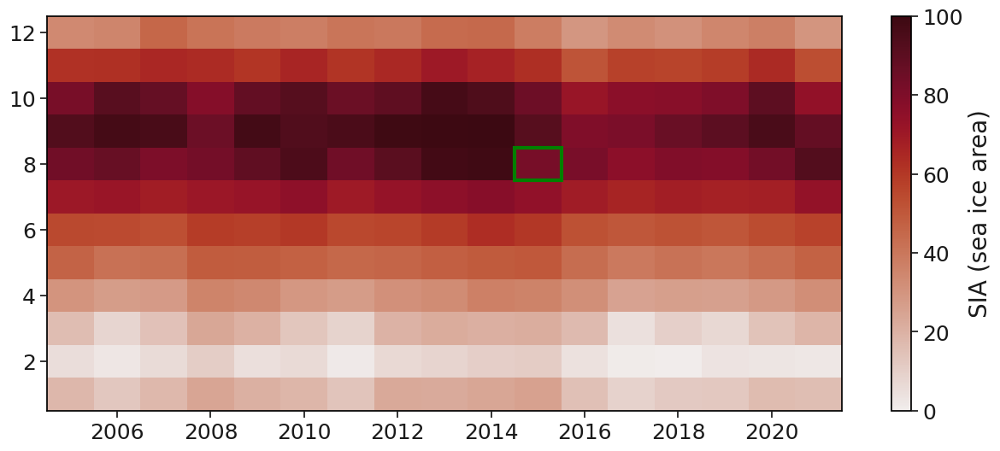

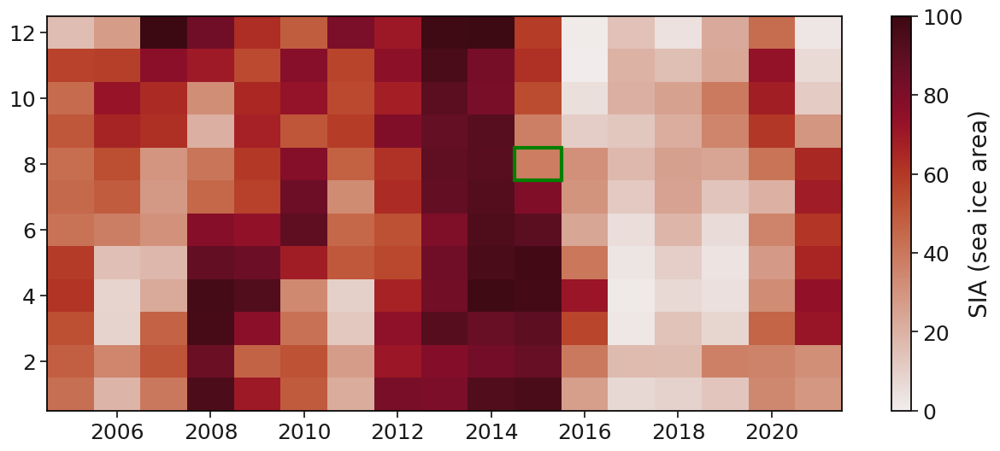

In [171]:
import matplotlib.patches as patches

# Reshape data into a 2D grid for pcolormesh
sia_2d = (si['sia'].sum(('lat','lon')).rank('time')/si.time.size*100).values.reshape(-1, 12)  # Assuming each year has 12 months
years = np.unique(si['time.year'].values)  # Unique years
months = range(1, 13)  # 1 to 12 for months

# Create the pcolormesh plot
plt.figure(figsize=(15, 6))
mesh = plt.pcolormesh(years, months, sia_2d.T, cmap=cmocean.cm.amp, shading='auto',vmin=0,vmax=100)
plt.colorbar(mesh, label='SIA (sea ice area)',ticks=np.arange(0,101,20))

# Calculate the rectangle's position and size
year_index = list(years).index(highlight_year)
rect = patches.Rectangle(
    (years[year_index] - 0.5, highlight_month - 0.5,),**rect_kw)
plt.gca().add_patch(rect)

# Reshape data into a 2D grid for pcolormesh
sia_2d = (si['sia_anm'].sum(('lat','lon')).rank('time')/si.time.size*100).values.reshape(-1, 12)  # Assuming each year has 12 months
years = np.unique(si['time.year'].values)  # Unique years
months = range(1, 13)  # 1 to 12 for months

# Create the pcolormesh plot
plt.figure(figsize=(15, 6))
mesh = plt.pcolormesh(years, months, sia_2d.T, cmap=cmocean.cm.amp, shading='auto',vmin=0,vmax=100)
plt.colorbar(mesh, label='SIA (sea ice area)',ticks=np.arange(0,101,20))

# Calculate the rectangle's position and size
year_index = list(years).index(highlight_year)
rect = patches.Rectangle(
    (years[year_index] - 0.5, highlight_month - 0.5,),**rect_kw)
plt.gca().add_patch(rect)

In [74]:
monthly_rankings

<xarray.Dataset>
Dimensions:    (time: 204)
Coordinates:
  * time       (time) datetime64[ns] 2005-01-31 2005-02-28 ... 2021-12-31
    year       (time) int64 2005 2005 2005 2005 2005 ... 2021 2021 2021 2021
    month      (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    sia_m      (time) float64 10.0 10.0 9.0 9.0 10.0 ... 14.0 5.0 2.0 2.0 2.0
    sia_anm_m  (time) float64 10.0 10.0 9.0 9.0 10.0 ... 14.0 5.0 2.0 2.0 2.0

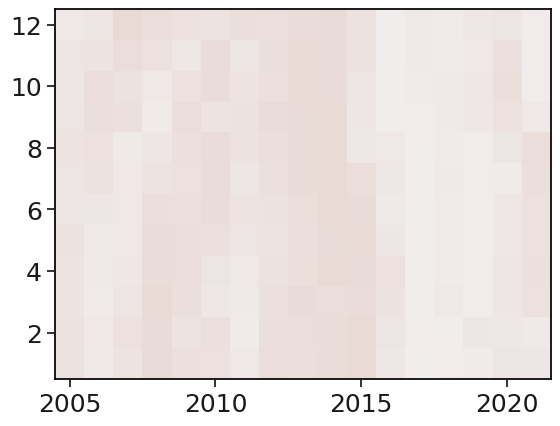

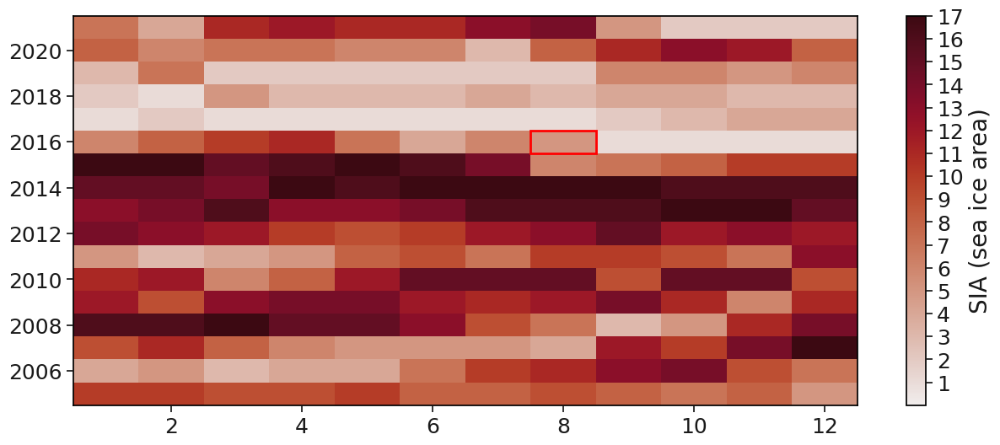

In [76]:
import matplotlib.patches as patches

# Reshape data into a 2D grid for pcolormesh
sia_2d = (si_t['sia_m']).values.reshape(-1, 12)  # Assuming each year has 12 months
years = si_t['year'].values[::12]  # Unique years
months = range(1, 13)  # 1 to 12 for months


# Define discrete levels
levels = np.arange(1,17.5,1)  # Adjust levels as needed
norm = mcolors.BoundaryNorm(boundaries=levels, ncolors=len(levels) - 1)

# Apply the norm to the pcolormesh
mesh = plt.pcolormesh(years, months, sia_2d.T, cmap=cmocean.cm.amp, norm=norm)

# Create the pcolormesh plot
plt.figure(figsize=(15, 6))
mesh = plt.pcolormesh(months, years, sia_2d, cmap=cmocean.cm.amp, shading='auto',vmin=0,vmax=17)
plt.colorbar(mesh, label='SIA (sea ice area)',ticks=levels)

# Add a rectangle to box August 2016
highlight_year = 2016
highlight_month = 8

# Calculate the rectangle's position and size
year_index = list(years).index(highlight_year)
rect = patches.Rectangle(
    (highlight_month - 0.5, years[year_index] - 0.5,),  # Bottom-left corner
    1,  # Width
    1,  # Height
    linewidth=2,
    edgecolor='red',
    facecolor='none'
)
plt.gca().add_patch(rect)

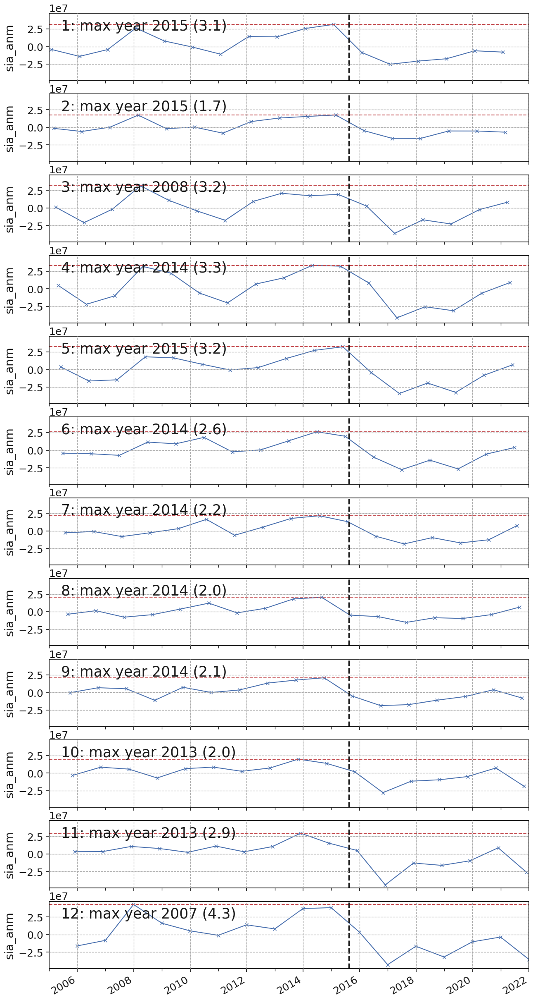

In [62]:
fig,ax = plt.subplots(12,1,figsize=(15,30),sharex=1,sharey=1)

si_mnths = si.sia_anm.sum(('lat','lon')).groupby('time.month')
for a,i in zip(ax.flatten(),range(1,13)):
    a.annotate(f'{i}: max year {si_mnths[i].idxmax().dt.year.data} ({(si_mnths[i].max()*1e-7).round(1).data})',
               xy=(0.025,0.75),xycoords='axes fraction',fontsize=25)
    si_mnths[i].plot(x='time',ax=a,marker='x')
    a.axhline(si_mnths[i].max(),c='r',ls='--')
    si_timeseries_plot_formatting(ax=a)
    a.grid(ls='--',c='darkgrey')

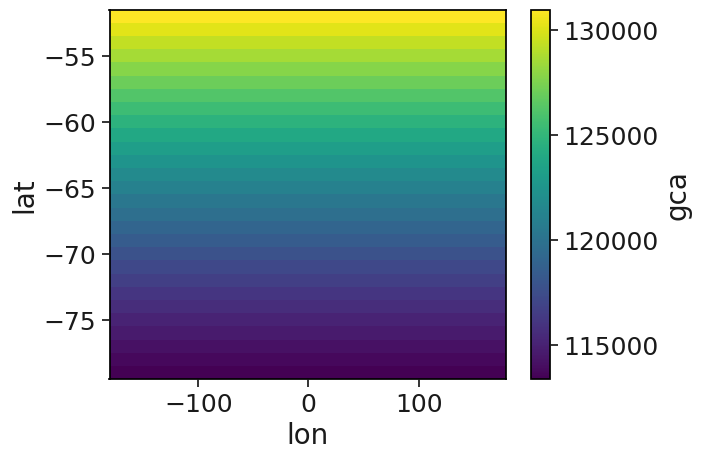

In [72]:
si.gca.plot(x='lon')

In [77]:
import numpy as np
import xarray as xr

def calculate_grid_cell_area(ds, lat_name='lat', lon_name='lon'):
    """
    Calculate the grid cell area for an xarray dataset with latitude and longitude dimensions.
    
    Parameters:
        ds (xarray.Dataset): Input dataset with latitude and longitude dimensions.
        lat_name (str): Name of the latitude dimension in the dataset (default: 'latitude').
        lon_name (str): Name of the longitude dimension in the dataset (default: 'longitude').
    
    Returns:
        xarray.Dataset: A new dataset with a single data variable 'gca', containing the grid cell areas in km².
    """
    # Earth's radius in kilometers
    R = 6371  
    
    # Extract latitude and longitude
    latitudes = ds[lat_name]
    longitudes = ds[lon_name]
    
    # Calculate the latitudinal and longitudinal resolution (assumes regular grid)
    delta_phi = np.radians(np.abs(latitudes[1] - latitudes[0]))  # Latitudinal resolution in radians
    delta_lambda = np.radians(np.abs(longitudes[1] - longitudes[0]))  # Longitudinal resolution in radians
    
    # Convert latitudes to radians
    lat_radians = np.radians(latitudes)
    
    # Calculate Δx and Δy
    delta_y = R * delta_phi  # Constant latitudinal height in km
    delta_x = R * np.cos(lat_radians) * delta_lambda  # Longitudinal width depends on latitude
    
    # Compute grid cell area (Δx * Δy)
    gca = (delta_x[:, np.newaxis] * delta_y)  # Broadcasting latitudinal and longitudinal terms
    
    # Create a new dataset with 'gca' as the grid cell area
    ds['gca'] = xr.DataArray(
        gca,
        dims=[lat_name, lon_name],
        coords={lat_name: latitudes, lon_name: longitudes},
        attrs={'units': 'km²', 'description': 'Grid cell area'}
    )
    
    
    return ds

In [78]:
si2 = calc_grid_cell_area(si)

In [81]:
si.gca

<xarray.DataArray 'gca' (lat: 28, lon: 360)>
array([[113379.16241889, 113379.16241889, 113379.16241889, ...,
        113379.16241889, 113379.16241889, 113379.16241889],
       [113765.57198354, 113765.57198354, 113765.57198354, ...,
        113765.57198354, 113765.57198354, 113765.57198354],
       [114180.57104782, 114180.57104782, 114180.57104782, ...,
        114180.57104782, 114180.57104782, 114180.57104782],
       ...,
       [129376.15257672, 129376.15257672, 129376.15257672, ...,
        129376.15257672, 129376.15257672, 129376.15257672],
       [130175.36520511, 130175.36520511, 130175.36520511, ...,
        130175.36520511, 130175.36520511, 130175.36520511],
       [130977.14399001, 130977.14399001, 130977.14399001, ...,
        130977.14399001, 130977.14399001, 130977.14399001]])
Coordinates:
  * lon      (lon) int64 -180 -179 -178 -177 -176 -175 ... 175 176 177 178 179
  * lat      (lat) int64 -79 -78 -77 -76 -75 -74 -73 ... -57 -56 -55 -54 -53 -52

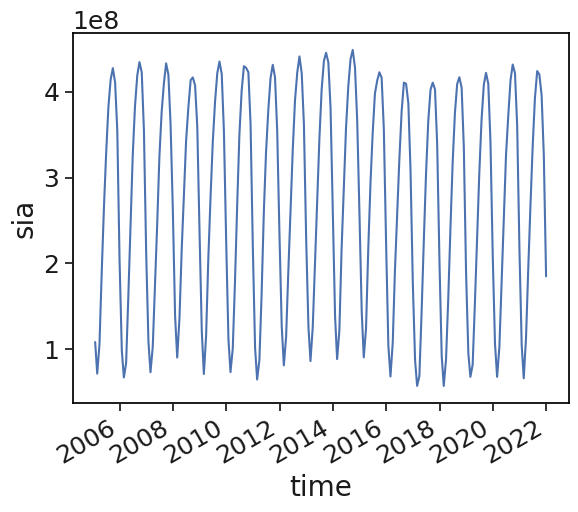

In [86]:
si.sia.groupby('time.year').sum(('lat','lon')).plot(x='time')#.max()

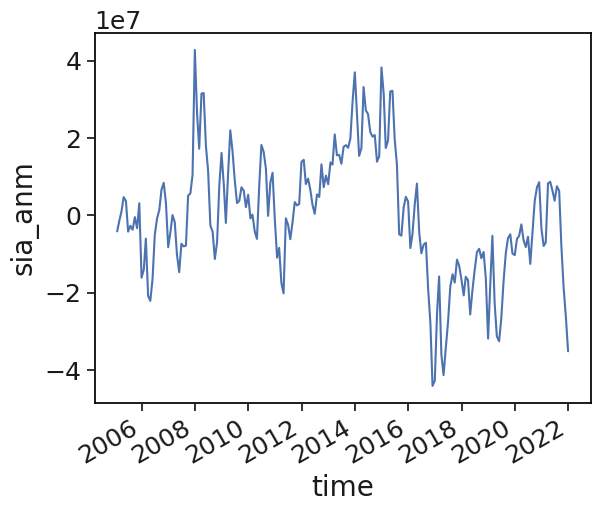

In [90]:
si.sia_anm.groupby('time.year').sum(('lat','lon')).plot(x='time')#.max()

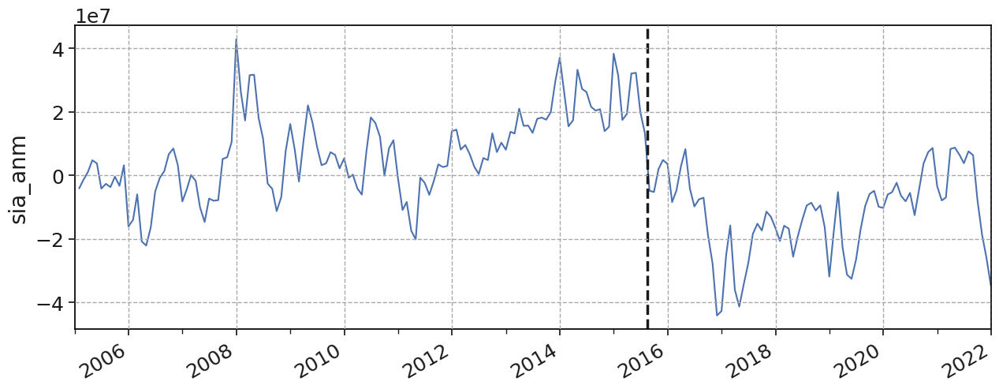

In [12]:
si.sia_anm.sum(('lat','lon')).plot(x='time',figsize=(15,5))
plt.grid(ls='--',c='darkgrey')
si_timeseries_plot_formatting(ax=plt.gca())

## add SAM (and other climate oscillation indeces?)

In [10]:
from plot_formatting import plot_gridlines

In [6]:
sam = load_SAM_data()
#sam = sam.isel(time=slice(11,252-12*3+1))

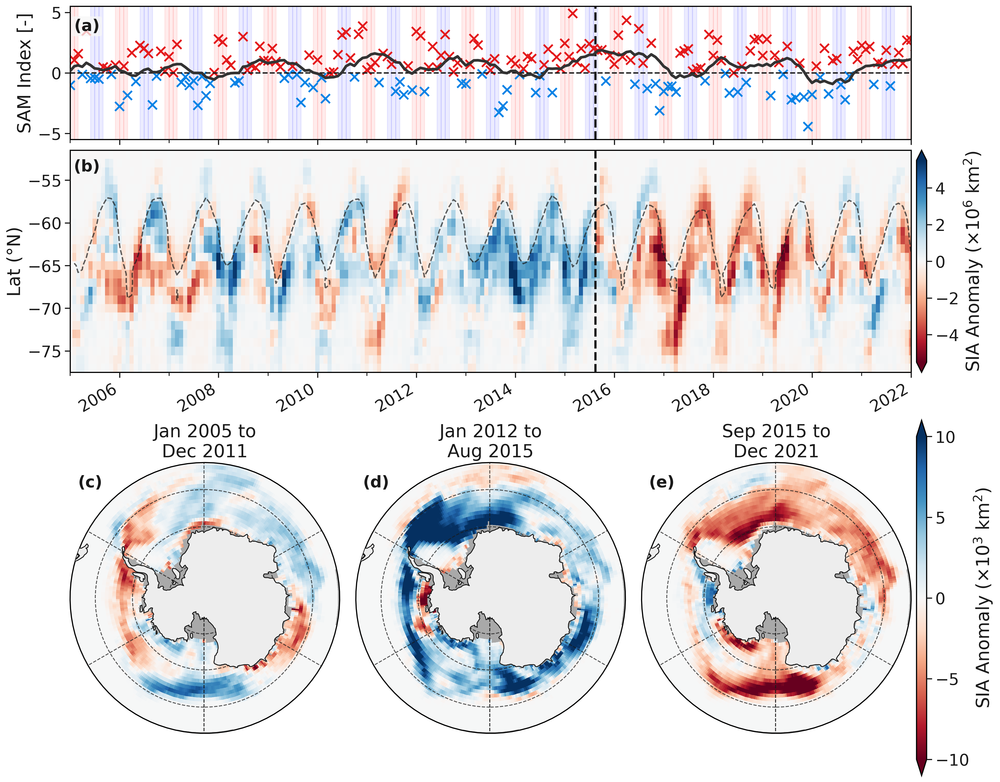

In [15]:
idx = int(np.where(si.time==np.datetime64('2015-08-31'))[0])

fig = plt.figure(figsize=(15*1.025, 12), constrained_layout=True, dpi=300)
gs  = gridspec.GridSpec(3, 4, figure=fig, height_ratios=[3/4, 1.25, 2], width_ratios=[2/3, 2/3, 2/3, 0.025])
#gs2 = gridspec.GridSpec(5, 4, figure=fig, height_ratios=[3/4, 1.25, 0.5,1,0.5], width_ratios=[2/3, 2/3, 2/3, 0.025])
crs = ccrs.PlateCarree()

# Create subplot axes and colorbar axes
ax = []
ax.append(fig.add_subplot(gs[0, :-1]))
cax = []
for i in range(2):
    cax.append(fig.add_subplot(gs[i+1, -1]))

# plot SAM data
scat_kw = dict(x='time',ax=ax[0],marker='x',s=100,zorder=2,lw=2)
sam[sam<=0].plot.scatter(**scat_kw,c='#0983e6')
sam[sam>0].plot.scatter(**scat_kw,c='#e41a1c')
#sam.plot(x='time',ax=ax[0],c='#9a9a9a',alpha=0.55,zorder=1,lw=2.5)
sam.rolling({'time':11}).mean().plot(x='time',ax=ax[0],c='#333333',zorder=3,lw=3)
plot_with_season_background(sam,ax=ax[0])

#plot_lin_reg_single_dim(sam,ax=ax[0])
ax[0].axhline(0,c='k',ls='--')
ax[0].set_ylim(-5.5,5.5)
ax[0].set_ylabel('SAM Index [-]')

# plot time series of sea ice area
ax.append(fig.add_subplot(gs[1, :-1]))
cb_kw = dict(extend='both',shrink=0.8)
cnt_kw = dict(levels=[0.15],colors=['k'],linestyles=['--'],alpha=0.7,)
hmp = ((si.sia.sum('lon') - si.sia_mn.sum('lon'))*1e-6
          ).plot(x='time',ax=ax[-1],vmax=5.5,cmap=cmap_br.reversed(),add_colorbar=False,)
fig.colorbar(hmp,cax=cax[0],**cb_kw,label=r'SIA Anomaly ($\times 10^6$ km$^2$)')
si.sic.mean('lon').plot.contour(x='time',**cnt_kw)

# timeseries plot formatting
for a in ax:
    a.set_xlim(np.datetime64('2004-12-31'),np.datetime64('2022-01-01'))
    a.xaxis.set_minor_locator(AutoDateLocator(maxticks=20))
    a.set_xlabel('')
for a,z in zip(ax[:2],[0,3]):
    a.axvline(x=np.datetime64('2015-08-15'),c='k',ls='--',lw=2.5,zorder=z)
ax[0].set_xticklabels('')
ax[1].set_ylim(-77.5,-51.5)
ax[1].set_ylabel('Lat (°N)')

# create subplots for two time means before and after sea ice change
for i in range(3):
    ax.append(fig.add_subplot(gs[2, i], projection=ccrs.SouthPolarStereo()))
# format circular plots
for a in ax[2:]:
    circular_boundary(a)
    a.set_extent([0,360,-90,-53],crs=crs)
    a.add_feature(cfeature.LAND,zorder=9,facecolor="#ededed",)
    a.coastlines(zorder=10,color="k",) # shows continental coastline
    a.set_facecolor('darkgrey')

# plot average anomaly before and after Aug 2015
kwargs = dict(x='lon',add_colorbar=False,vmin=-10,cmap=cmap_br.reversed(),transform=crs)
(si.sia_anm*1e-3).sel(time=slice(np.datetime64('2005-01-01'),np.datetime64('2011-12-31'))
              ).mean('time').plot(ax=ax[2],**kwargs)
(si.sia_anm*1e-3).sel(time=slice(np.datetime64('2012-01-01'),np.datetime64('2015-08-31'))
                         ).mean('time').plot(ax=ax[3],**kwargs)
hmp = (si.sia_anm*1e-3).sel(time=slice(np.datetime64('2015-09-01'),np.datetime64('2022-01-01'))
                    ).mean('time').plot(ax=ax[4],**kwargs)

for a,s in zip(ax[2:],['Jan 2005 to\nDec 2011','Jan 2012 to\nAug 2015','Sep 2015 to\nDec 2021']):
    a.set_title(s,fontsize=20)
    plot_gridlines(a,color='k',)
    #plot_gridlines(a,color='k',draw_labels=True,lat_tick=np.array([-70, -60, -50]),)
    #plot_gridlines(a,color='k',draw_labels=False,lat_tick=np.array([-80]),)

fig.colorbar(hmp,cax=cax[1],extend='both',label='SIA Anomaly 'r'($\times 10^3$ km$^2$)',
            ticks=np.arange(-10,11,5))

ax[-1].set_ylabel('')
ax[-1].set_yticklabels('')

fig_labels(0.02,0.85,ax=ax[0],j=0,fs=18)
fig_labels(0.02,0.925,ax=ax[1],j=1,fs=18)
fig_labels(0.075,0.925,ax=ax[2:],j=2,add_bbox=False,fs=18)

#fig.tight_layout()

In [21]:
empty_ax

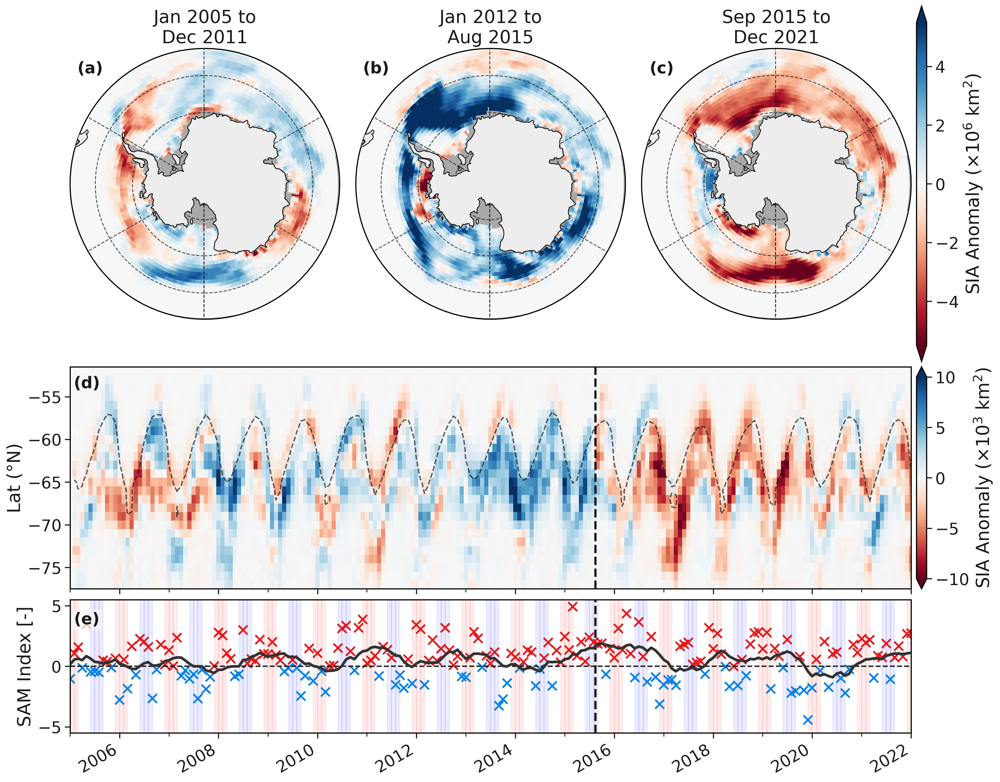

In [9]:
idx = int(np.where(si.time==np.datetime64('2015-08-31'))[0])

fig = plt.figure(figsize=(15*1.025, 12), constrained_layout=True, dpi=300)
gs  = gridspec.GridSpec(3, 4, figure=fig, height_ratios=[2, 1.25, 3/4], width_ratios=[2/3, 2/3, 2/3, 0.025])
#gs2 = gridspec.GridSpec(5, 4, figure=fig, height_ratios=[0.5,1,0.5, 1.25, 3/4], width_ratios=[2/3, 2/3, 2/3, 0.025])
crs = ccrs.PlateCarree()

# Create subplot axes and colorbar axes
ax = []
ax.append(fig.add_subplot(gs[-1, :-1]))

cax = []
for i in range(2):
    cax.append(fig.add_subplot(gs[i, -1]))

# plot SAM data
scat_kw = dict(x='time',ax=ax[0],marker='x',s=100,zorder=2,lw=2)
sam[sam<=0].plot.scatter(**scat_kw,c='#0983e6')
sam[sam>0].plot.scatter(**scat_kw,c='#e41a1c')
#sam.plot(x='time',ax=ax[0],c='#9a9a9a',alpha=0.55,zorder=1,lw=2.5)
sam.rolling({'time':11}).mean().plot(x='time',ax=ax[0],c='#333333',zorder=3,lw=3)
plot_with_season_background(sam,ax=ax[0])

#plot_lin_reg_single_dim(sam,ax=ax[0])
ax[0].axhline(0,c='k',ls='--')
ax[0].set_ylim(-5.5,5.5)
ax[0].set_ylabel('SAM Index [-]')

# plot time series of sea ice area
ax.append(fig.add_subplot(gs[1, :-1]))
cb_kw = dict(extend='both',shrink=0.8)
cnt_kw = dict(levels=[0.15],colors=['k'],linestyles=['--'],alpha=0.7,)
hmp = ((si.sia.sum('lon') - si.sia_mn.sum('lon'))*1e-6
          ).plot(x='time',ax=ax[-1],vmax=5.5,cmap=cmap_br.reversed(),add_colorbar=False,)
fig.colorbar(hmp,cax=cax[0],**cb_kw,label=r'SIA Anomaly ($\times 10^6$ km$^2$)')
si.sic.mean('lon').plot.contour(x='time',**cnt_kw)

# timeseries plot formatting
for a in ax:
    a.set_xlim(np.datetime64('2004-12-31'),np.datetime64('2022-01-01'))
    a.xaxis.set_minor_locator(AutoDateLocator(maxticks=20))
    a.set_xlabel('')
for a,z in zip(ax[:2],[0,3]):
    a.axvline(x=np.datetime64('2015-08-15'),c='k',ls='--',lw=2.5,zorder=z)
ax[1].set_xticklabels('')
ax[1].set_ylim(-77.5,-51.5)
ax[1].set_ylabel('Lat (°N)')

# create subplots for two time means before and after sea ice change
for i in range(3):
    ax.append(fig.add_subplot(gs[0, i], projection=ccrs.SouthPolarStereo()))
# format circular plots
for a in ax[2:]:
    circular_boundary(a)
    a.set_extent([0,360,-90,-53],crs=crs)
    a.add_feature(cfeature.LAND,zorder=9,facecolor="#ededed",)
    a.coastlines(zorder=10,color="k",) # shows continental coastline
    a.set_facecolor('darkgrey')

# plot average anomaly before and after Aug 2015
kwargs = dict(x='lon',add_colorbar=False,vmin=-10,cmap=cmap_br.reversed(),transform=crs)
(si.sia_anm*1e-3).sel(time=slice(np.datetime64('2005-01-01'),np.datetime64('2011-12-31'))
              ).mean('time').plot(ax=ax[2],**kwargs)
(si.sia_anm*1e-3).sel(time=slice(np.datetime64('2012-01-01'),np.datetime64('2015-08-31'))
                         ).mean('time').plot(ax=ax[3],**kwargs)
hmp = (si.sia_anm*1e-3).sel(time=slice(np.datetime64('2015-09-01'),np.datetime64('2022-01-01'))
                    ).mean('time').plot(ax=ax[4],**kwargs)

for a,s in zip(ax[2:],['Jan 2005 to\nDec 2011','Jan 2012 to\nAug 2015','Sep 2015 to\nDec 2021']):
    a.set_title(s,fontsize=20)
    plot_gridlines(a,color='k',)
    #plot_gridlines(a,color='k',draw_labels=True,lat_tick=np.array([-70, -60, -50]),)
    #plot_gridlines(a,color='k',draw_labels=False,lat_tick=np.array([-80]),)

fig.colorbar(hmp,cax=cax[1],extend='both',label='SIA Anomaly 'r'($\times 10^3$ km$^2$)',
            ticks=np.arange(-10,11,5))

ax[-1].set_ylabel('')
ax[-1].set_yticklabels('')

fig_labels(0.02,0.85,ax=ax[0],j=4,fs=18)
fig_labels(0.02,0.925,ax=ax[1],j=3,fs=18)
fig_labels(0.075,0.925,ax=ax[2:],j=0,add_bbox=False,fs=18)

#fig.tight_layout()

## overall SIA changes checks

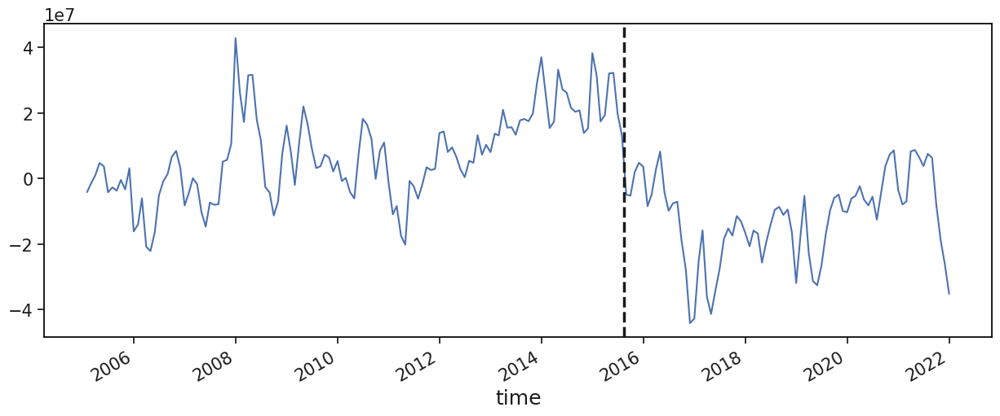

In [63]:
(si.sia.sum(('lon','lat')) - si.sia_mn.sum(('lon','lat'))).plot(x='time',figsize=(15,5))
plt.gca().axvline(x=np.datetime64('2015-08-15'),c='k',ls='--',lw=2.5,zorder=z)


In [70]:
sum = si.sia.sum(('lon','lat'))

In [74]:
sum.sel(time=np.datetime64(str(i)+'-08-31'))

<xarray.DataArray 'sia' ()>
array(4.13749231e+08)
Coordinates:
    time     datetime64[ns] 2020-08-31

In [86]:
arr = []
for i in range(2005,2015):
    arr += sum.sel(time=np.datetime64(str(i)+'-08-31')).data,

arr = np.asarray(arr)

In [90]:
arr

array([4.14266931e+08, 4.19339574e+08, 4.10156187e+08, 4.13716849e+08,
       4.21743336e+08, 4.30072136e+08, 4.16235230e+08, 4.22770323e+08,
       4.36149635e+08, 4.38349141e+08])

In [89]:
arr.min()

410156187.1084871

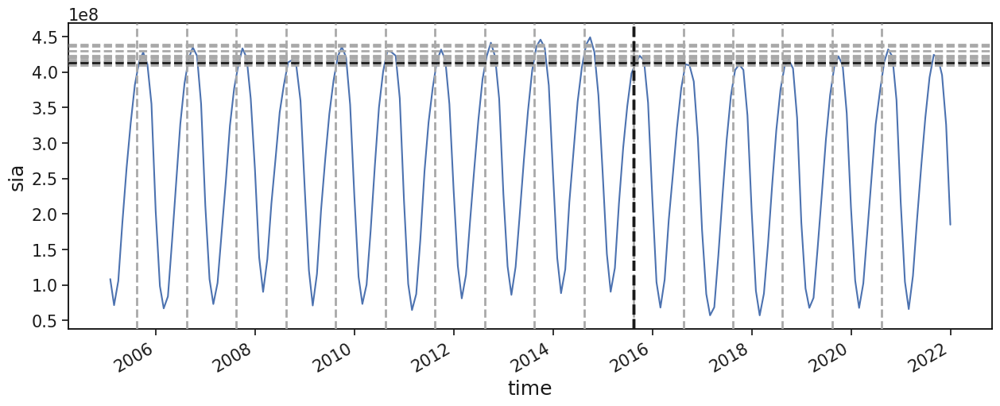

In [78]:
sum = si.sia.sum(('lon','lat'))
sum.plot(x='time',figsize=(15,5))
plt.gca().axvline(x=np.datetime64('2015-08-15'),c='k',ls='--',lw=2.5,zorder=z)

for i in range(2005,2021):
    plt.gca().axvline(x=np.datetime64(str(i)+'-08-15'),c='darkgrey',ls='--',lw=2,zorder=z)
for i in range(2005,2015):
    plt.gca().axhline(y=sum.sel(time=np.datetime64(str(i)+'-08-31')),c='darkgrey',ls='--',lw=2,zorder=z)

plt.gca().axvline(x=np.datetime64('2015-08-15'),c='k',ls='--',lw=2.5,zorder=z)
plt.gca().axhline(y=sum.sel(time='2015-08-31'),c='k',ls='--',lw=2,zorder=z)


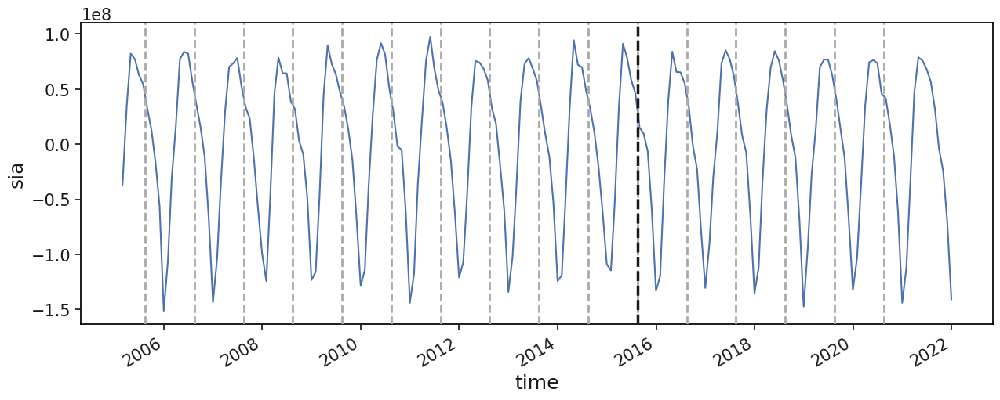

In [68]:
(si.sia.sum(('lon','lat'))).diff('time').plot(x='time',figsize=(15,5))

for i in range(2005,2021):
    plt.gca().axvline(x=np.datetime64(str(i)+'-08-15'),c='darkgrey',ls='--',lw=2,zorder=z)


plt.gca().axvline(x=np.datetime64('2015-08-15'),c='k',ls='--',lw=2.5,zorder=z)


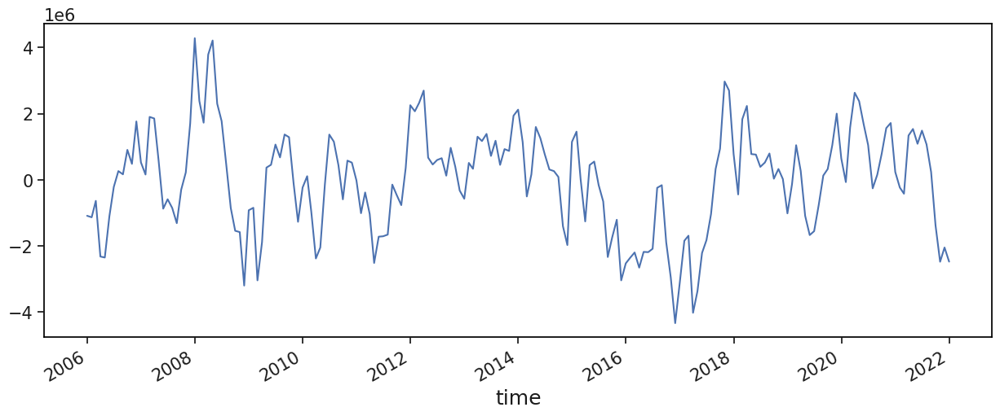

In [16]:
(si.sia.sum(('lon','lat')) - si.sia_mn.sum(('lon','lat'))).diff('time'
        ).rolling({'time':11}).mean().plot(x='time',figsize=(15,5))

In [9]:
tmp = (si.sia.sum(('lon','lat')) - si.sia_mn.sum(('lon','lat')))

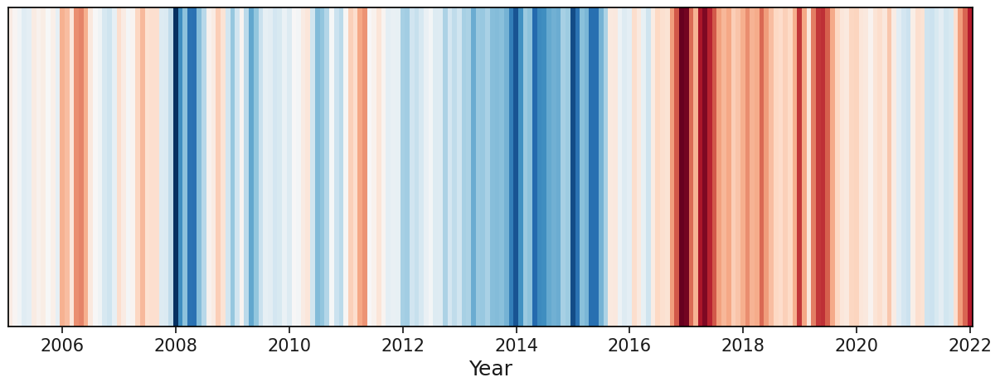

In [10]:
plot_1D_heatmap((si.sia.sum(('lon','lat')) - si.sia_mn.sum(('lon','lat'))))

## meridional sea ice area:

In [3]:
zones = [
         np.arange(-65,25),    # DP + WG
         np.arange(25,80),     # upstream of KP
         np.arange(80,150),    # downstream of KP
    np.concatenate([np.arange(150,180),np.arange(-180,-130)]), # ross sea
         np.arange(-130,-65),  # amundsen and bellinghausen sea
]
sectors = ["WS","KP-u","KP-d","RS","ABS",]
c = ['#332288', '#117733', '#DDCC77', '#CC6677', '#882255']

In [4]:
zones[0][0]
zones[0][-1]

24

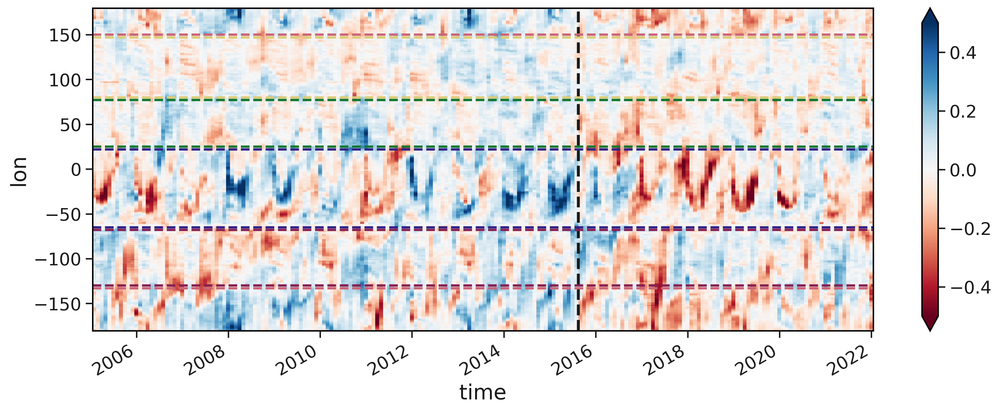

In [8]:
plt.figure(figsize=(15,5),dpi=300)
((si.sia.sum('lat') - si.sia_mn.sum('lat'))*1e-6
          ).plot(x='time',cmap=cmap_br.reversed(),vmax=0.5)
ax = plt.gca()
ax.axvline(x=np.datetime64('2015-08-15'),c='k',ls='--',lw=2.5,zorder=1)
for i in range(len(zones)):
    ax.axhline(zones[i][0],c=c[i],lw=2,ls='--')
    ax.axhline(zones[i][-3],c=c[i],lw=2,ls='--')

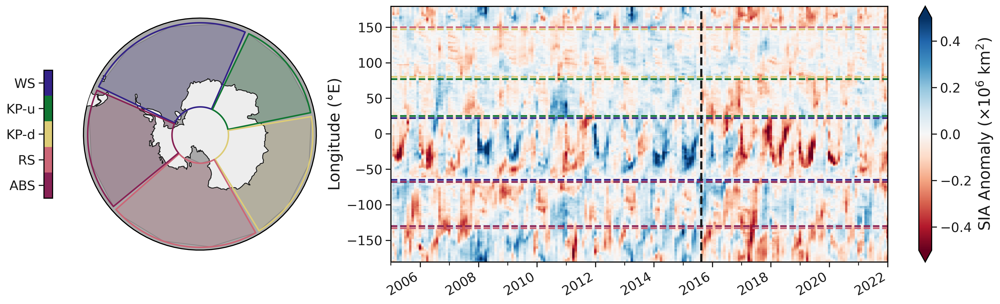

In [15]:
fig = plt.figure(figsize=(15*1.1, 5), dpi=300)
gs = gridspec.GridSpec(1, 2, figure=fig, width_ratios=[1.5, 3],)
#gs = gridspec.GridSpec(1, 3, figure=fig, width_ratios=[0.1,1, 3],)
#gs2 = gridspec.GridSpec(1, 3, figure=fig, width_ratios=[0.1,1, 3],wspace=0.05)
crs = ccrs.PlateCarree()

# Create subplots for the first row (excluding the colorbar space)
ax = []

# Create subplots for the second and third rows
j=0
ax.append(fig.add_subplot(gs[j, 0],projection=ccrs.SouthPolarStereo()))
ax[-1].set_facecolor('darkgrey')

# run for all axes
a = ax[-1]
circular_boundary(a)
a.set_extent([0,360,-90,-50],crs=crs)
a.add_feature(cfeature.LAND,zorder=9,facecolor="#ededed",)
a.coastlines(zorder=10,color="k") # shows continental coastline
a.set_facecolor('darkgrey')

# kwargs for circumpolar plots
kwargs = dict(x='lon',transform=crs,)
c = plot_SO_zones_map(ax[-1],zones,lw=1.75)

#ax.append(fig.add_subplot(gs[j, 0],))
cb = fig.colorbar(plt.cm.ScalarMappable(cmap=ListedColormap(c)), ax=ax[-1],
                  shrink=0.5, aspect=15, location='left')
# set cbar ticks
x = len(zones)
x_space = 1/x
cb.set_ticks(np.arange(x_space/2,1,x_space))
cb.set_ticklabels(sectors)
cb.ax.minorticks_off()
cb.ax.invert_yaxis()

# plot meridional SIA
ax.append(fig.add_subplot(gs[j, 1]))
#ax[-1].set_facecolor('#cfcfcf')
((si.sia.sum('lat') - si.sia_mn.sum('lat'))*1e-6
          ).plot(x='time',ax=ax[-1],cmap=cmap_br.reversed(),vmax=0.5,
                cbar_kwargs=dict(label=r'SIA Anomaly $(\times 10^6$ km$^2$)'))

a = ax[-1]
a.set_xlim(np.datetime64('2004-12-31'),np.datetime64('2022-01-01'))
a.xaxis.set_minor_locator(AutoDateLocator(maxticks=20))
a.set_xlabel('')
a.set_ylabel('Longitude (°E)')
a.axvline(x=np.datetime64('2015-08-15'),c='k',ls='--',lw=2.5,zorder=3)

for i in range(len(zones)):
    a.axhline(zones[i][0],c=c[i],lw=2,ls='--')
    a.axhline(zones[i][-3],c=c[i],lw=2,ls='--')

fig.tight_layout()

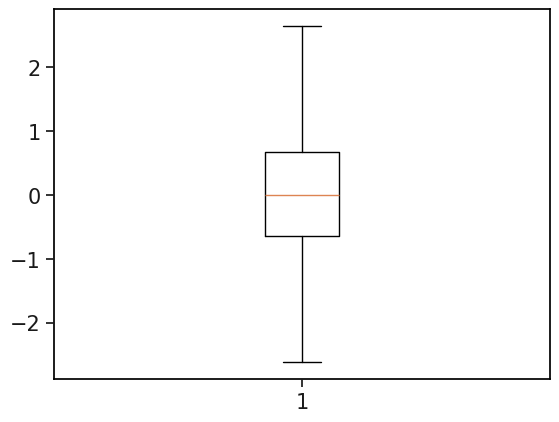

In [138]:
boxplot(100*(si.sia.sum('lat') - si.sia_mn.sum('lat'))/(si.sia.sum(('lat','lon')) - si.sia_mn.sum(('lat','lon'))).__abs__())

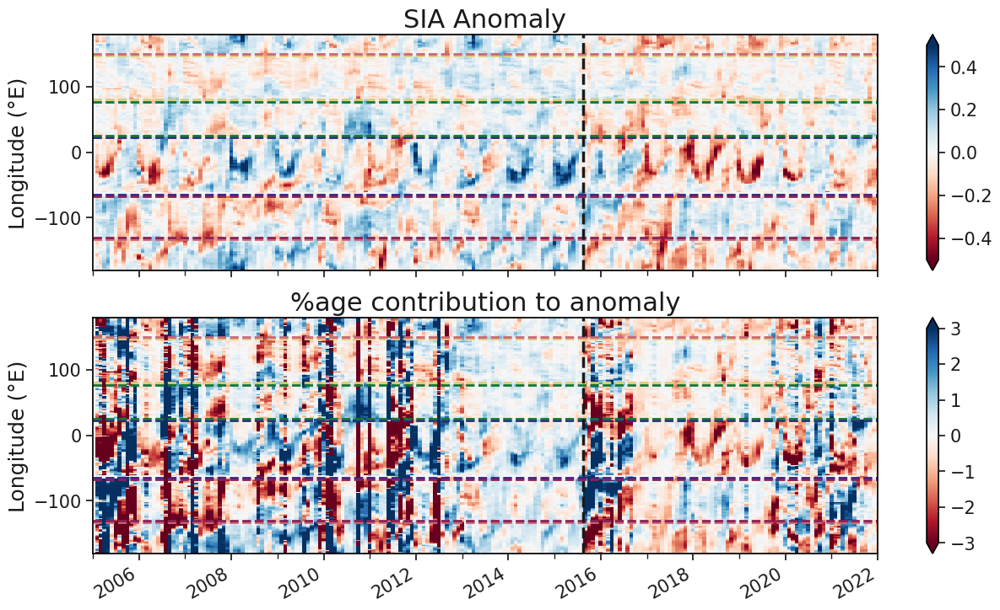

In [150]:
fig,ax = plt.subplots(2,1,figsize=(15,8))

((si.sia.sum('lat') - si.sia_mn.sum('lat'))*1e-6
          ).plot(x='time',ax=ax[0],cmap=cmap_br.reversed(),vmax=0.5)

(100*(si.sia.sum('lat') - si.sia_mn.sum('lat'))/(si.sia.sum(('lat','lon')) - si.sia_mn.sum(('lat','lon'))
                                                ).__abs__()
    ).plot(x='time',ax=ax[1],vmax=3,cmap=cmap_br.reversed())
ax[0].set_title('SIA Anomaly')
ax[1].set_title('%age contribution to anomaly')


ax[0].set_xticklabels('')
for a in ax:
    a.set_xlim(np.datetime64('2004-12-31'),np.datetime64('2022-01-01'))
    a.xaxis.set_minor_locator(AutoDateLocator(maxticks=20))
    a.set_xlabel('')
    a.set_ylabel('Longitude (°E)')
    a.axvline(x=np.datetime64('2015-08-15'),c='k',ls='--',lw=2.5,zorder=3)
    for i in range(len(zones)):
        a.axhline(zones[i][0],c=c[i],lw=2,ls='--')
        a.axhline(zones[i][-3],c=c[i],lw=2,ls='--')

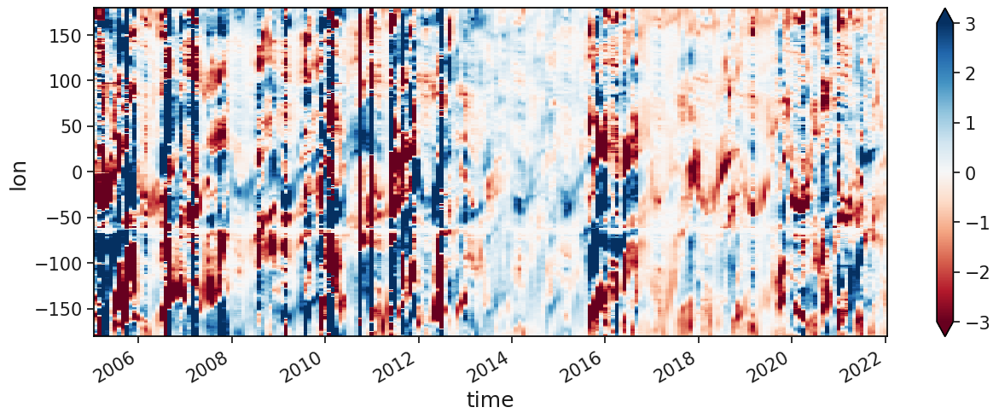

In [164]:
(100*(si.sia.sum('lat') - si.sia_mn.sum('lat'))/(si.sia.sum(('lat','lon')) - si.sia_mn.sum(('lat','lon'))).__abs__()
    ).plot(x='time',figsize=(15,5),vmax=3,cmap=cmap_br.reversed())

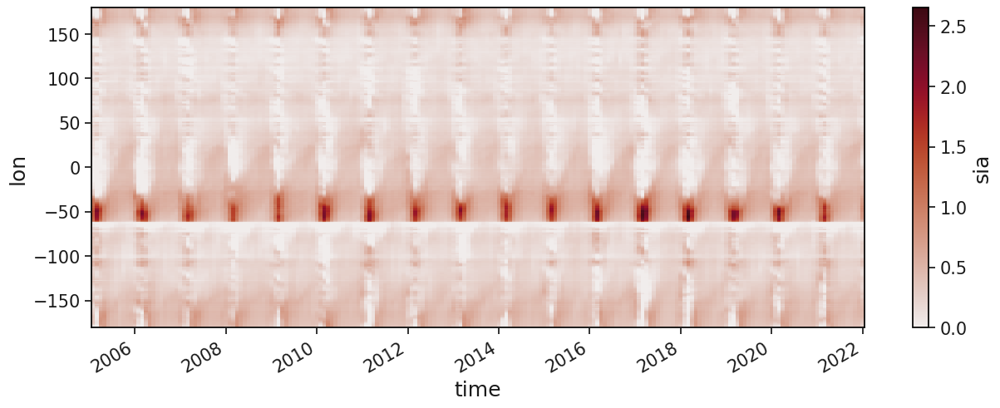

In [61]:
(si.sia.sum('lat')*100/si.sia.sum(('lat','lon'))).plot(x='time',cmap='cmo.amp',vmin=0,figsize=(15,5))

In [84]:
arr = np.ndarray([len(zones),si.time.size])*np.nan

In [16]:
arr = np.ndarray([len(zones),si.time.size])*np.nan
anm = np.ndarray([len(zones),si.time.size])*np.nan
for i in range(len(zones)):
    arr[i] = (si.sia.sum('lat')*100/si.sia.sum(('lat','lon'))).sel(lon=zones[i]).sum('lon').data
    anm[i] = (100*(si.sia.sum('lat') - si.sia_mn.sum('lat'))/(si.sia.sum(('lat','lon')) - si.sia_mn.sum(('lat','lon'))
                                                        ).__abs__()).sel(lon=zones[i]).sum('lon').data

In [108]:
sectors

['WS', 'KP-u', 'KP-d', 'RS', 'ABS']

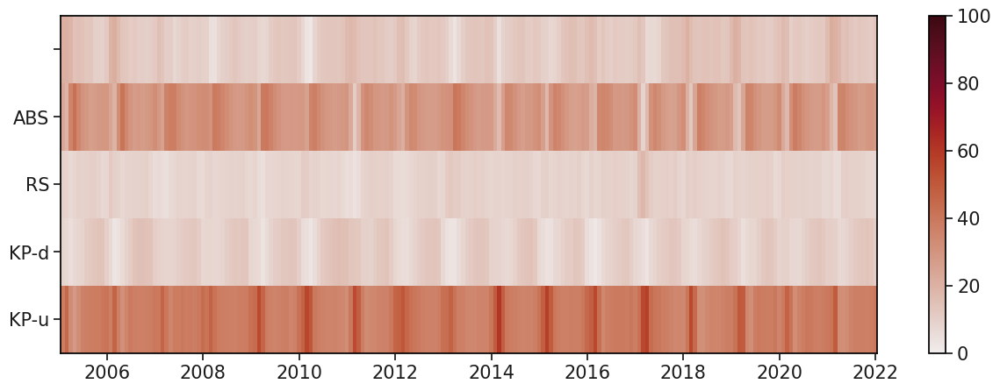

In [120]:
plt.figure(figsize=(15,5))
plt.pcolormesh(si.time,np.arange(len(zones)),arr,cmap='cmo.amp',vmin=0,vmax=100)
plt.gca().set_yticklabels(['WS', 'KP-u', 'KP-d', 'RS', 'ABS'])
plt.colorbar()

In [17]:
tmp = xr.Dataset(
            data_vars = dict(sia = (['sectors','time',], arr),
                             anm = (['sectors','time',], anm),
                            ),
            coords   = dict(sectors = (['sectors'], np.arange(len(sectors))),
                            time = (['time'], si.time.data),
                            ),)

Text(0.5, 1.0, 'SIA contribution per ocean sector')

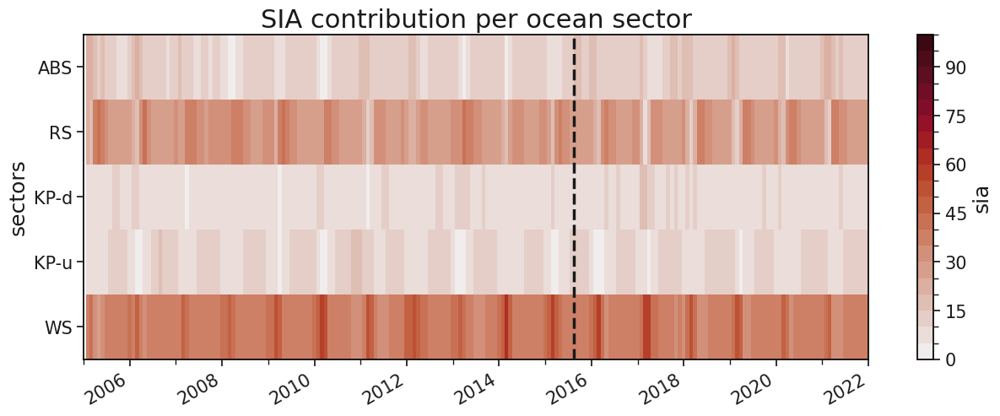

In [151]:
tmp.sia.plot(x='time',cmap='cmo.amp',vmin=0,vmax=100,levels=21,figsize=(15,5))

a = plt.gca()
a.set_xlim(np.datetime64('2004-12-31'),np.datetime64('2022-01-01'))
a.xaxis.set_minor_locator(AutoDateLocator(maxticks=20))
a.set_xlabel('')
a.axvline(x=np.datetime64('2015-08-15'),c='k',ls='--',lw=2.5,zorder=3)
a.set_yticks(tmp.sectors,labels=sectors)

plt.title('SIA contribution per ocean sector')

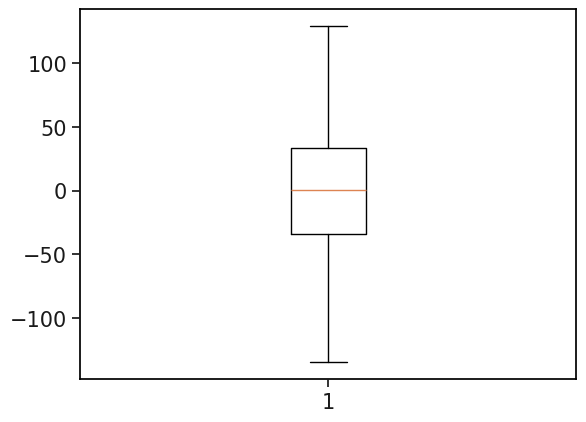

In [160]:
boxplot(tmp.anm)

In [184]:
print('number of sign differences between anomaly and percentage contribution: ',
      ((((si.sia.sum('lat') - si.sia_mn.sum('lat'))*1e-6
          ).sum('lon')<0) != (tmp.anm.sum('sectors')<0)).sum().data)
print('\nnote all anomaly percentages total to |%_anm|=100%)')
print('the above shows where the percentage contribution is negative, so is the sign of the anomaly')

number of sign differences between anomaly and percentage contribution:  0

note all anomaly percentages total to |%_anm|=100%)
the above shows where the percentage contribution is negative, so is the sign of the anomaly


In [201]:
sia_anm = (si.sia.sum(('lon','lat')) - si.sia_mn.sum(('lon','lat')))

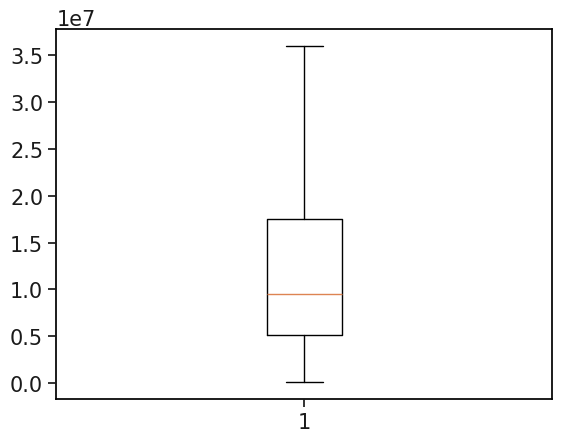

In [205]:
boxplot(sia_anm.__abs__())

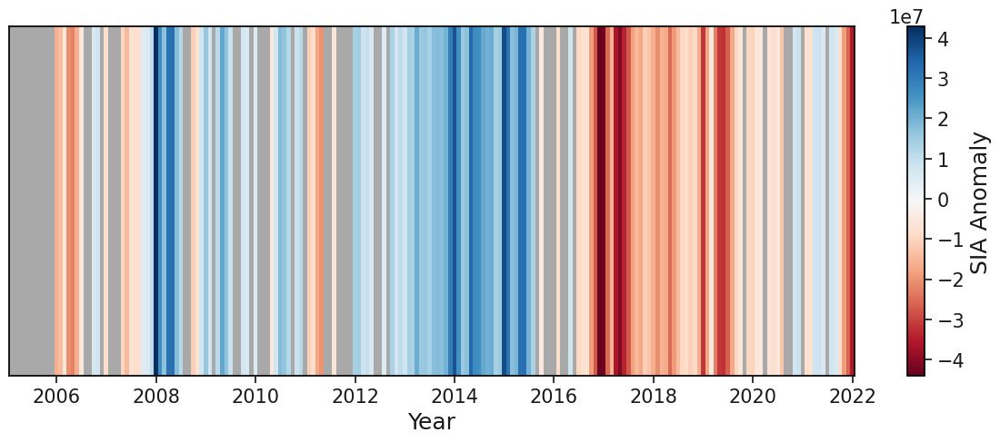

In [208]:
plot_1D_heatmap(sia_anm.where(sia_anm.__abs__()>0.5e7),add_cbar=True)
plt.gca().set_facecolor('darkgrey')

$$\frac{x'_{lon}}{|x'|}$$

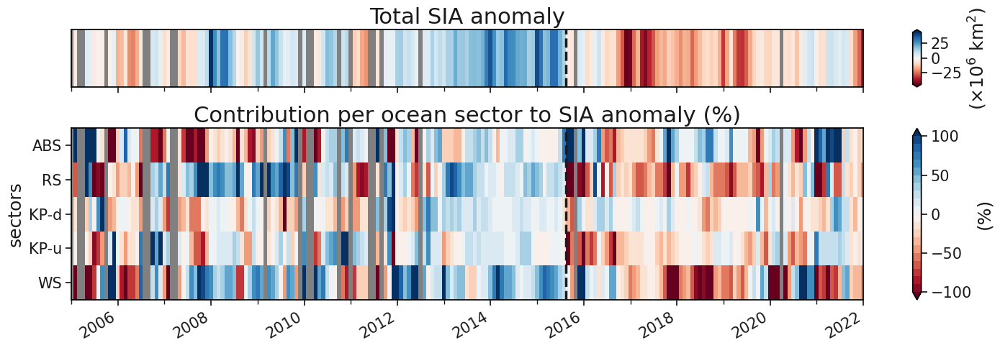

In [233]:
fig,ax = plt.subplots(2,1,sharex='col',figsize=(15,5),height_ratios=(1,3))


hmp = plot_1D_heatmap(sia_anm.where(sia_anm.__abs__()>0.25e7)*1e-6,ax=ax[0],add_cbar=False)
fig.colorbar(hmp,ax=ax[0],aspect=20/3,extend='both',label=r'($\times 10^6$ km$^2$)')

hmp = tmp.anm.where(sia_anm.__abs__()>0.25e7).plot(x='time',cmap=cmap_br.reversed(),vmin=-100,vmax=100,levels=21,ax=ax[1],
            cbar_kwargs=dict(label='(%)',))
hmp.colorbar.set_ticks(np.arange(-100,110,50))
hmp.colorbar.minorticks_off()

for a in ax:
    a.set_xlim(np.datetime64('2004-12-31'),np.datetime64('2022-01-01'))
    a.xaxis.set_minor_locator(AutoDateLocator(maxticks=20))
    a.set_xlabel('')
    a.axvline(x=np.datetime64('2015-08-15'),c='k',ls='--',lw=2.5,zorder=3)
    a.set_facecolor('grey')
    
ax[1].set_yticks(tmp.sectors,labels=sectors)
ax[0].set_title('Total SIA anomaly')
ax[1].set_title('Contribution per ocean sector to SIA anomaly (%)')

#fig.suptitle('MASKED low SIA anom years')
fig.tight_layout()

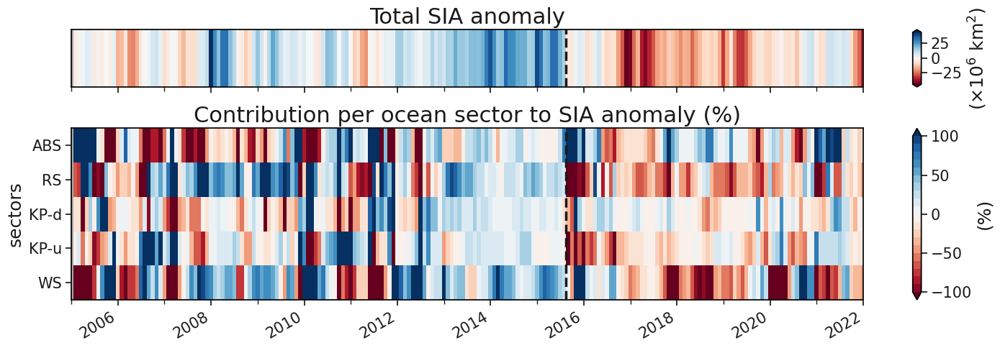

In [229]:
fig,ax = plt.subplots(2,1,sharex='col',figsize=(15,5),height_ratios=(1,3))


hmp = plot_1D_heatmap(sia_anm*1e-6,ax=ax[0],add_cbar=False)
fig.colorbar(hmp,ax=ax[0],aspect=20/3,extend='both',label=r'($\times 10^6$ km$^2$)')

hmp = tmp.anm.plot(x='time',cmap=cmap_br.reversed(),vmin=-100,vmax=100,levels=21,ax=ax[1],
            cbar_kwargs=dict(label='(%)',))
hmp.colorbar.set_ticks(np.arange(-100,110,50))
hmp.colorbar.minorticks_off()

for a in ax:
    a.set_xlim(np.datetime64('2004-12-31'),np.datetime64('2022-01-01'))
    a.xaxis.set_minor_locator(AutoDateLocator(maxticks=20))
    a.set_xlabel('')
    a.axvline(x=np.datetime64('2015-08-15'),c='k',ls='--',lw=2.5,zorder=3)
    a.set_facecolor('darkgrey')
    
ax[1].set_yticks(tmp.sectors,labels=sectors)
ax[0].set_title('Total SIA anomaly')
ax[1].set_title('Contribution per ocean sector to SIA anomaly (%)')

fig.tight_layout()

In [314]:
#pre_ice = tmp.anm.sel(time=slice(np.datetime64('2012-01-01'),np.datetime64('2015-08-15')))
pre_ice = tmp.anm.where(sia_anm.__abs__()>0.25e7).sel(time=slice(np.datetime64('2012-01-01'),np.datetime64('2015-08-15')))

#post_ice = tmp.anm.sel(time=slice(np.datetime64('2015-08-15'),np.datetime64('2022-01-01')))
post_ice = tmp.anm.where(sia_anm.__abs__()>0.25e7).sel(time=slice(np.datetime64('2015-08-15'),np.datetime64('2022-01-01')))

Text(0.5, 1.0, 'Elevated SIA (Jan 2012-Aug 2015)')

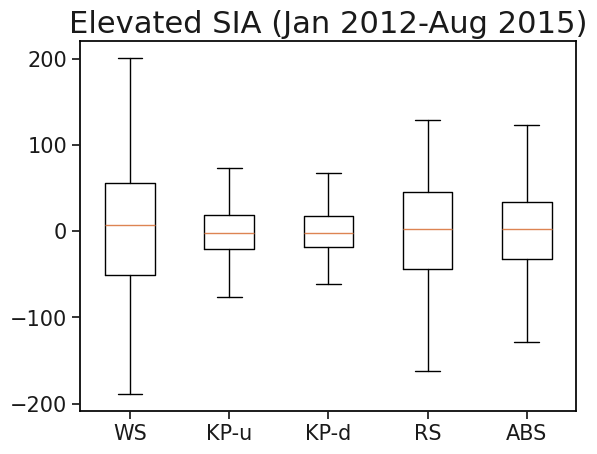

In [19]:
for_box = []
for i in range(len(tmp.sectors)):
    for_box += tmp.anm[i],

plt.boxplot(for_box,showfliers=0)
plt.gca().set_xticklabels(sectors)
plt.title('Elevated SIA (Jan 2012-Aug 2015)')


Text(0.5, 1.0, 'Elevated SIA (Jan 2012-Aug 2015)')

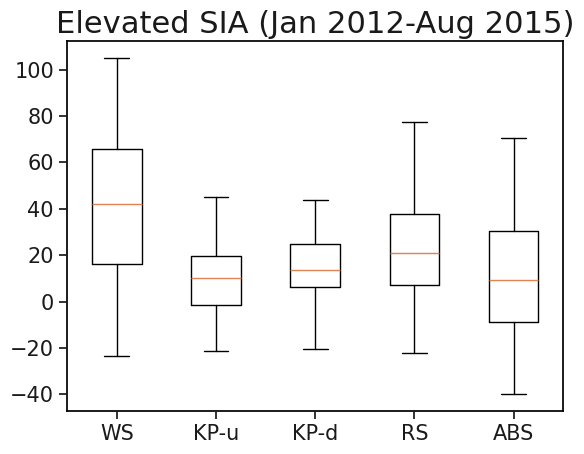

In [301]:
for_box = []
for i in range(len(tmp.sectors)):
    for_box += pre_ice[i][~np.isnan(pre_ice[i])],

plt.boxplot(for_box,showfliers=0)
plt.gca().set_xticklabels(sectors)
plt.title('Elevated SIA (Jan 2012-Aug 2015)')


Text(0.5, 1.0, 'Reduced SIA (Aug 2015-Jan 2022)')

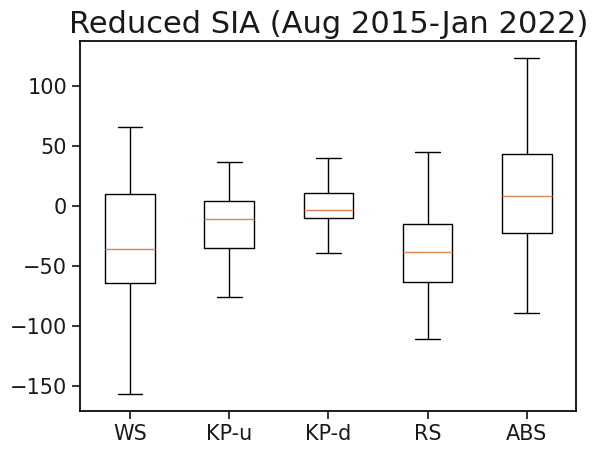

In [302]:
for_box = []
for i in range(len(tmp.sectors)):
    for_box += post_ice[i],

plt.boxplot(for_box,showfliers=0)
plt.gca().set_xticklabels(sectors)
plt.title('Reduced SIA (Aug 2015-Jan 2022)')

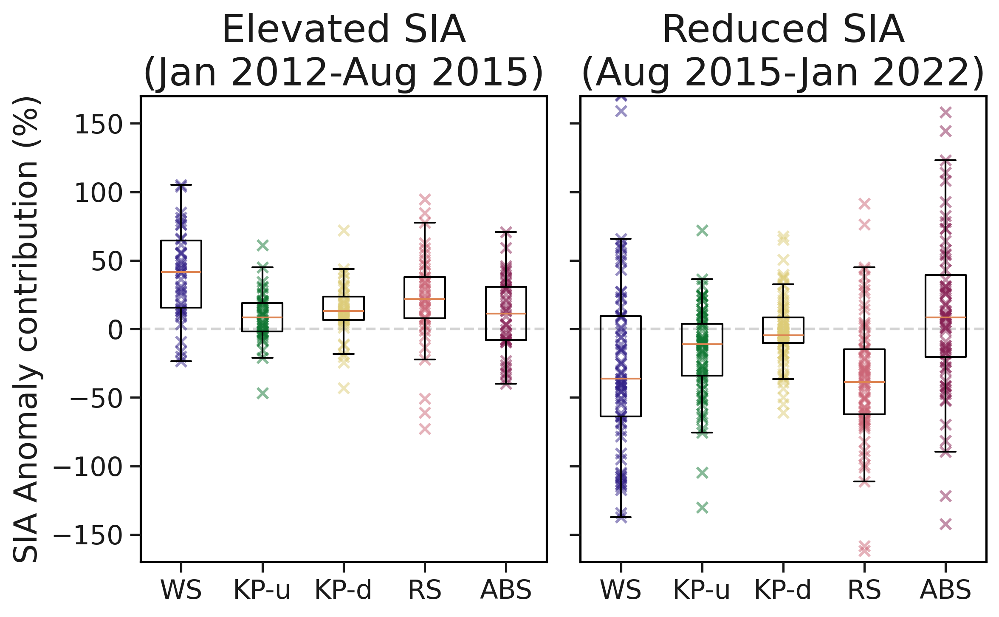

In [370]:
fig,ax = plt.subplots(1,2,sharey=True,figsize=(8,5),dpi=300)

for_box = []
for i in range(len(tmp.sectors)):
#    for_box += pre_ice[i],
    for_box += pre_ice[i][~np.isnan(pre_ice[i])],

ax[0].boxplot(for_box,showfliers=0)
for i,b in enumerate(for_box):
    ax[0].scatter(x=np.ones(b.size)+i,y=b,c=c[i],marker='x',alpha=0.5)
ax[0].set_xticklabels(sectors)
ax[0].set_title('Elevated SIA\n(Jan 2012-Aug 2015)')
ax[0].set_ylabel('SIA Anomaly contribution (%)')

for_box = []
for i in range(len(tmp.sectors)):
#    for_box += post_ice[i],
    for_box += post_ice[i][~np.isnan(post_ice[i])],

ax[1].boxplot(for_box,showfliers=0)
for i,b in enumerate(for_box):
    ax[1].scatter(x=np.ones(b.size)+i,y=b,c=c[i],marker='x',alpha=0.5)
ax[1].set_xticklabels(sectors)
ax[1].set_title('Reduced SIA\n(Aug 2015-Jan 2022)')

plt.ylim(-170,170)

for a in ax:
    a.axhline(0,ls='--',c='lightgrey',zorder=0)

fig.tight_layout()

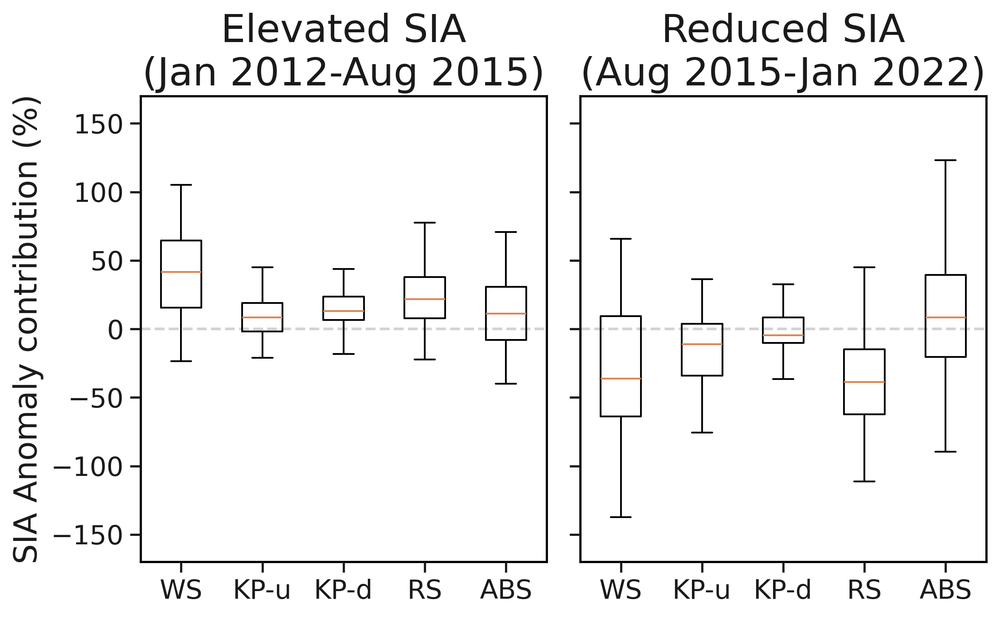

In [371]:
fig,ax = plt.subplots(1,2,sharey=True,figsize=(8,5),dpi=300)

for_box = []
for i in range(len(tmp.sectors)):
#    for_box += pre_ice[i],
    for_box += pre_ice[i][~np.isnan(pre_ice[i])],

ax[0].boxplot(for_box,showfliers=0)
#for i,b in enumerate(for_box):
 #   ax[0].scatter(x=np.ones(b.size)+i,y=b,c=c[i],marker='x',alpha=0.5)
ax[0].set_xticklabels(sectors)
ax[0].set_title('Elevated SIA\n(Jan 2012-Aug 2015)')
ax[0].set_ylabel('SIA Anomaly contribution (%)')

for_box = []
for i in range(len(tmp.sectors)):
#    for_box += post_ice[i],
    for_box += post_ice[i][~np.isnan(post_ice[i])],

ax[1].boxplot(for_box,showfliers=0)
#for i,b in enumerate(for_box):
 #   ax[1].scatter(x=np.ones(b.size)+i,y=b,c=c[i],marker='x',alpha=0.5)
ax[1].set_xticklabels(sectors)
ax[1].set_title('Reduced SIA\n(Aug 2015-Jan 2022)')

plt.ylim(-170,170)

for a in ax:
    a.axhline(0,ls='--',c='lightgrey',zorder=0)

fig.tight_layout()

{'whiskers': [<matplotlib.lines.Line2D at 0x70377abcc410>,
 'caps': [<matplotlib.lines.Line2D at 0x70377abcd810>,
 'boxes': [<matplotlib.lines.Line2D at 0x70377abbfbd0>],
 'medians': [<matplotlib.lines.Line2D at 0x70377abce650>],
 'fliers': [<matplotlib.lines.Line2D at 0x70377abcef90>],
 'means': []}

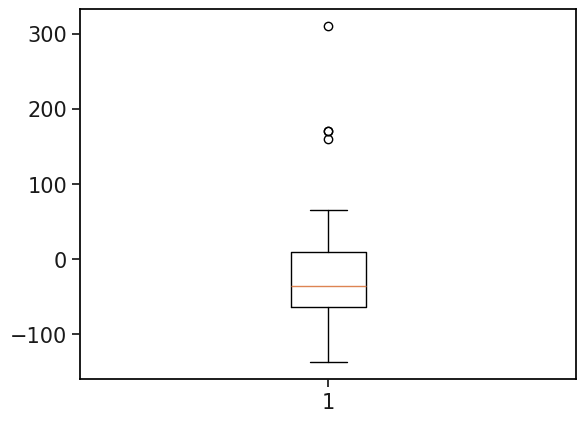

In [340]:
plt.boxplot(for_box[0])

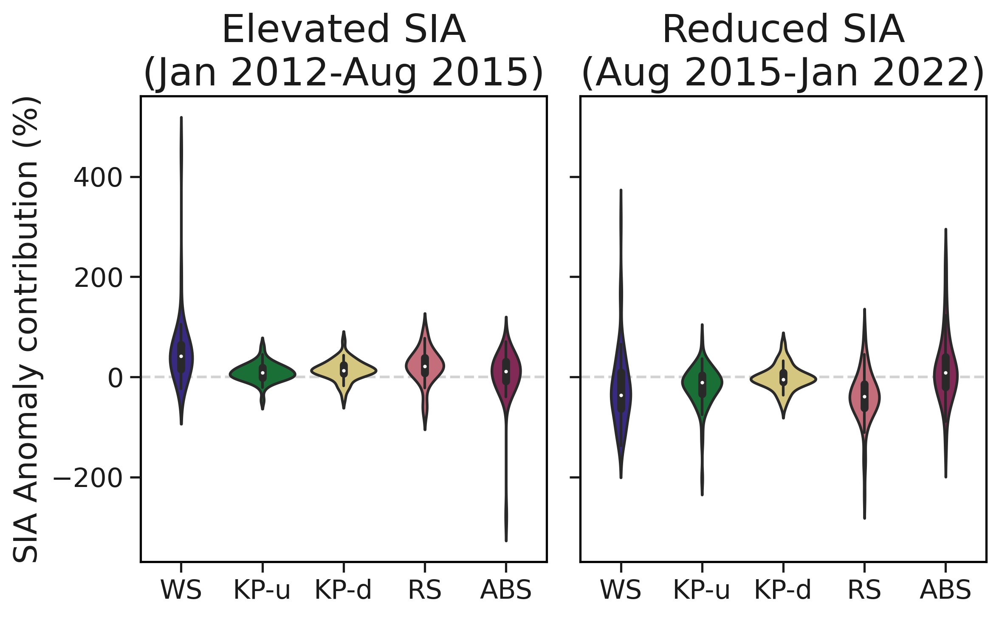

In [373]:
fig,ax = plt.subplots(1,2,sharey=True,figsize=(8,5),dpi=300)

vp_kwargs = dict(palette=c,saturation=0.85)

for_box = []
for i in range(len(tmp.sectors)):
#    for_box += pre_ice[i],
    for_box += pre_ice[i][~np.isnan(pre_ice[i])],

sns.violinplot(ax=ax[0],data=for_box,**vp_kwargs,)
#ax[0].boxplot(for_box,showfliers=0)
ax[0].set_xticklabels(sectors)
ax[0].set_title('Elevated SIA\n(Jan 2012-Aug 2015)')
ax[0].set_ylabel('SIA Anomaly contribution (%)')

for_box = []
for i in range(len(tmp.sectors)):
#    for_box += post_ice[i],
    for_box += post_ice[i][~np.isnan(post_ice[i])],

#ax[1].boxplot(for_box,showfliers=0)
sns.violinplot(ax=ax[1],data=for_box,**vp_kwargs)
ax[1].set_xticklabels(sectors)
ax[1].set_title('Reduced SIA\n(Aug 2015-Jan 2022)')

#plt.ylim(-170,170)

for a in ax:
    a.axhline(0,ls='--',c='lightgrey',zorder=0)

fig.tight_layout()

<Axes: >

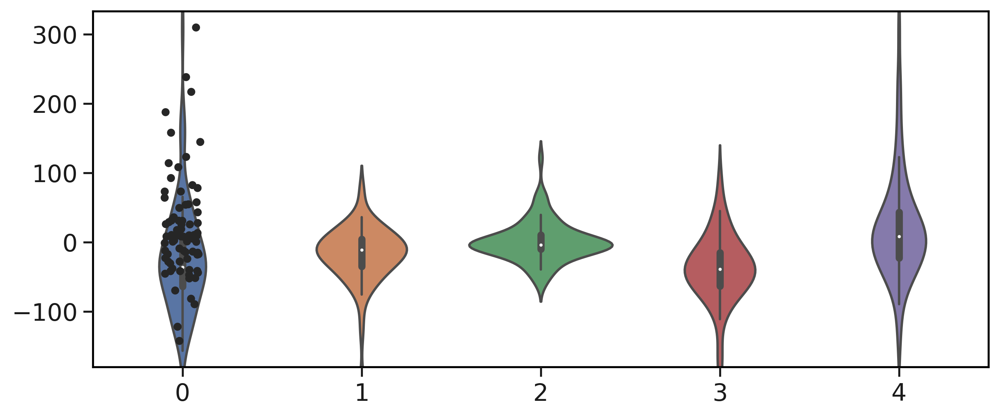

In [312]:
plt.figure(figsize=(10,4),dpi=300)
sns.violinplot(data=for_box,)
sns.stripplot(data=for_box, jitter=True, color='k', )  # Add scatter plot with jitter for better visualization
#plt.axhline(-5,ls='--',c='darkgrey')
#plt.ylabel(r'Log$_{10}(\kappa)$')

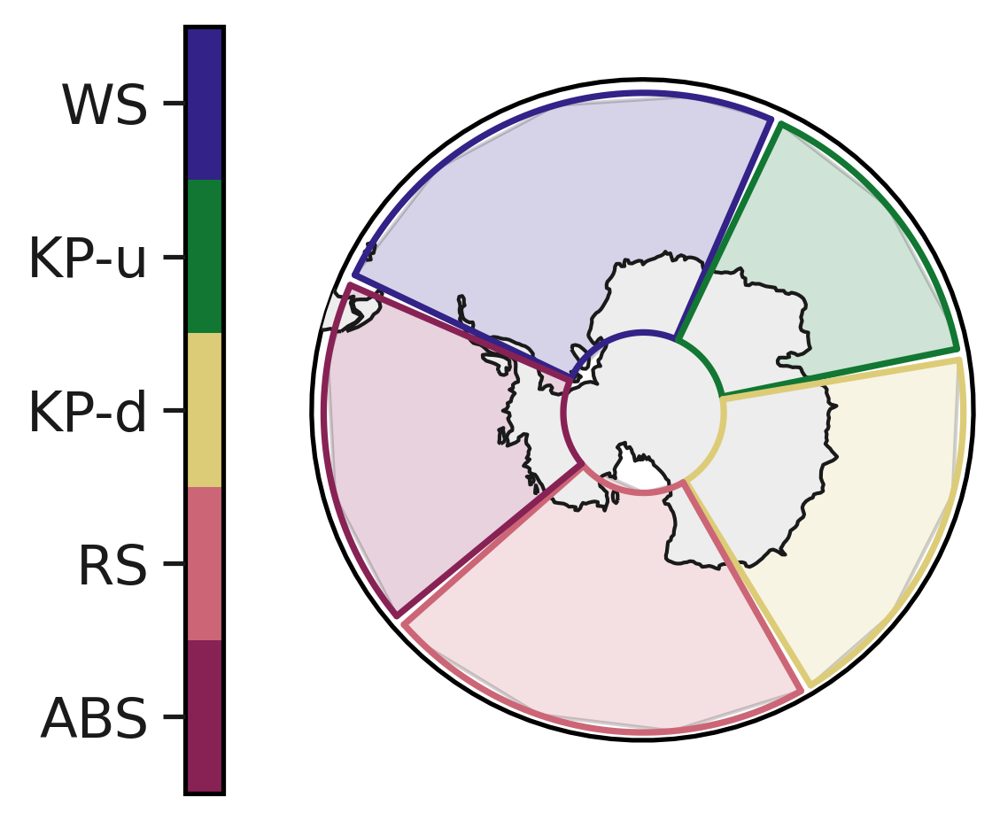

In [288]:
extent = [0,360,-90,-50]
crs = ccrs.PlateCarree()

plt.figure(figsize=(15*(1.2/4.2),3.75),dpi=300)
ax = plt.axes(projection=ccrs.SouthPolarStereo())
circular_boundary(ax)

ax.set_extent(extent, crs=crs)
ax.add_feature(cfeature.LAND, zorder=9, #edgecolor='lightgrey', 
               facecolor = "#ededed",
              )
ax.coastlines(zorder=10,color="k") # shows contin



## SO Zones timeseries
c = plot_SO_zones_map(ax,zones,lw=1.75)

# cbar for percentage
cb = plt.colorbar(plt.cm.ScalarMappable(cmap=ListedColormap(c)), ax=ax, location='left')
# set cbar ticks
x = len(zones)
x_space = 1/x
cb.set_ticks(np.arange(x_space/2,1,x_space))
cb.set_ticklabels(sectors)
cb.ax.minorticks_off()
cb.ax.invert_yaxis()